In [1]:
from fastai.tabular.all import load_pickle, save_pickle
import src.counterfactuals.rf.monthly.data_prep as dp
from src.data.processing import overlay

# Plotting
import seaborn as sns
import matplotlib.pyplot as plt
import contextily as cx
sns.set_theme(style="white", palette="Set2")
palette = sns.color_palette("Set2")

cm = sns.color_palette("Spectral", as_cmap=True)
inferno = sns.color_palette("inferno_r", as_cmap=True)

In [2]:
def calculate_derivatives(dep_var, df):
    df[f"{dep_var}_residual"] = df[dep_var] - df[f"{dep_var}_cf"]
    df[f"{dep_var}_rel"] = df[dep_var] / df[f"{dep_var}_cf"]
    df[f"{dep_var}_rel_residual"] = 1 - df[f"{dep_var}_rel"]
    return df

In [3]:
TARGET_VARIABLES = ["rh_98", "ndvi", "pai", "agbd"]
DISPLAY_VARIABLES = TARGET_VARIABLES + ["ndvi_diff"]

In [4]:
COLUMNS = ['longitude',
 'latitude',
 'absolute_time',
 'fire_size_acres',
 'fire_name',
 'fire_ig_date',
 'days_since_fire',
 'pre_fire_ndvi',
 'severity',
 'YSF',
 'YSF_cat_5',
 'agbd',
 'cover',
 'fhd_normal',
 'pai',
 'rh_25',
 'rh_50',
 'rh_70',
 'rh_98',
 'aspect',
 'elevation',
 'slope',
 'soil',
 'geometry',
 'tcc_2000',
 'tcc_2005',
 'tcc_2010',
 'tcc_2015',
 'ndvi',]

In [5]:
burned = load_pickle(overlay.MTBS_SEVERITY_WITH_PREFIRE_NDVI)
dfs = []
for variable in TARGET_VARIABLES:
    df = load_pickle(f"{dp.OUTPUT_PATH}/inference_{variable}.pkl")
    dfs.append(df[COLUMNS + [f"{variable}_cf", f"{variable}_std"]])

df = dfs[0].reset_index()
for other_df in dfs[1:]:
    df = df.merge(other_df)
df = df.set_index('shot_number')
df = df.join(burned.dnbr_mean, how="left")
df['ndvi_diff_residual'] = df['ndvi'] - df['pre_fire_ndvi']
df['ndvi_diff_rel'] = df["ndvi"] / df["pre_fire_ndvi"]

for variable in TARGET_VARIABLES:
    df = calculate_derivatives(variable, df)

In [36]:
df['fire_ig_year'] = df['fire_ig_date'].dt.year

In [84]:
df = df[df.dnbr_mean > -100]

In [129]:
fire_stats = df.groupby(['fire_name', 'fire_ig_year', 'severity']).agg(
    ndvi_residual=('ndvi_residual', 'mean'),
    ndvi_rel=('ndvi_rel', 'mean'),
    rh_98_residual=('rh_98_residual', 'mean'),
    rh_98_rel=('rh_98_rel', 'mean'),
    agbd_residual=('agbd_residual', 'mean'),
    agbd_rel=('agbd_rel', 'mean'),
    pai_residual=('pai_residual', 'mean'),
    pai_rel=('pai_rel', 'mean'),
    sample_count=('ndvi_residual', 'size'),
    dnbr_mean=('dnbr_mean', 'mean'),
    elevation = ('elevation', 'mean'),
    longitude = ('longitude', 'mean'),
    latitude = ('latitude', 'mean'),
    pre_fire_ndvi= ('pre_fire_ndvi', 'mean')  # Count the number of samples per group
).reset_index()

/tmp/ipykernel_3791899/664002271.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/tmp/ipykernel_3791899/664002271.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
/tmp/ipykernel_3791899/664002271.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


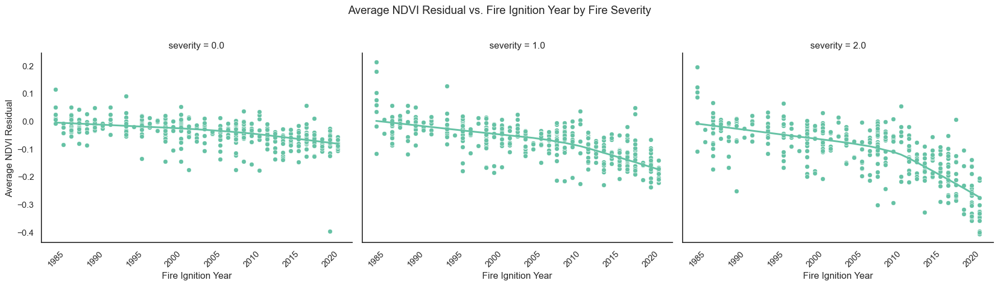

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

# Convert fire_ig_year to a continuous variable if it isn't already
fire_stats['fire_ig_year'] = pd.to_numeric(fire_stats['fire_ig_year'], errors='coerce')

# Create a FacetGrid to separate plots by severity
g = sns.FacetGrid(fire_stats, col='severity', height=5, aspect=1.2, col_wrap=3)
g.map(sns.scatterplot, 'fire_ig_year', 'avg_ndvi_residual')
g.map(sns.regplot, 'fire_ig_year', 'avg_ndvi_residual', scatter=False, lowess=True)

# Rotate x-axis labels for better readability
for ax in g.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

# Add plot labels and title
g.set_axis_labels('Fire Ignition Year', 'Average NDVI Residual')
g.fig.suptitle('Average NDVI Residual vs. Fire Ignition Year by Fire Severity', y=1.02)

# Show plot
plt.tight_layout()
plt.show()


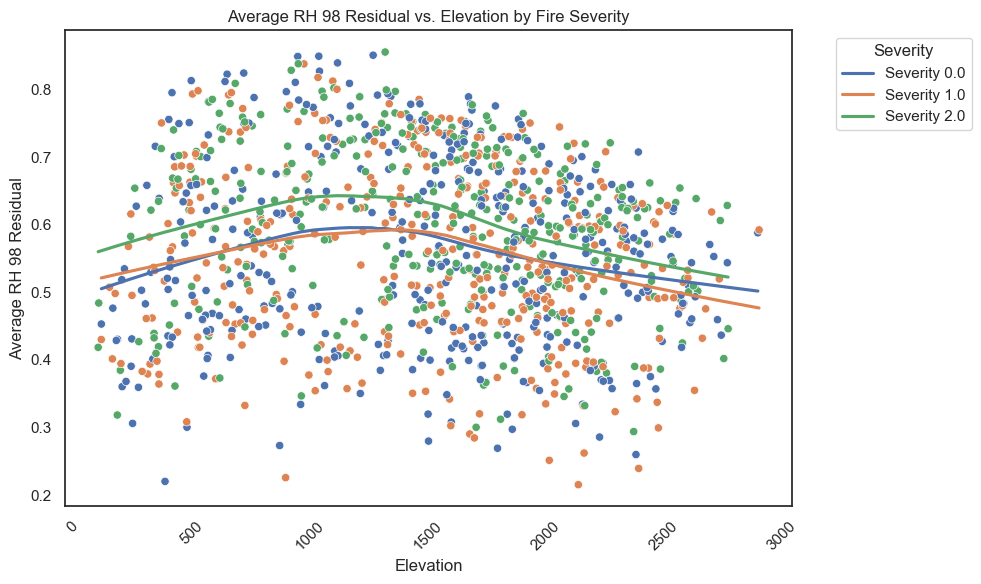

In [135]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='elevation', 
    y='pre_fire_ndvi', 
    data=fire_stats, 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    sns.regplot(
        x='elevation', 
        y='pre_fire_ndvi', 
        data=fire_stats[fire_stats['severity'] == severity], 
        scatter=False, 
        lowess=True, 
        color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}'
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Elevation')
plt.ylabel('Average RH 98 Residual')
plt.title('Average RH 98 Residual vs. Elevation by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


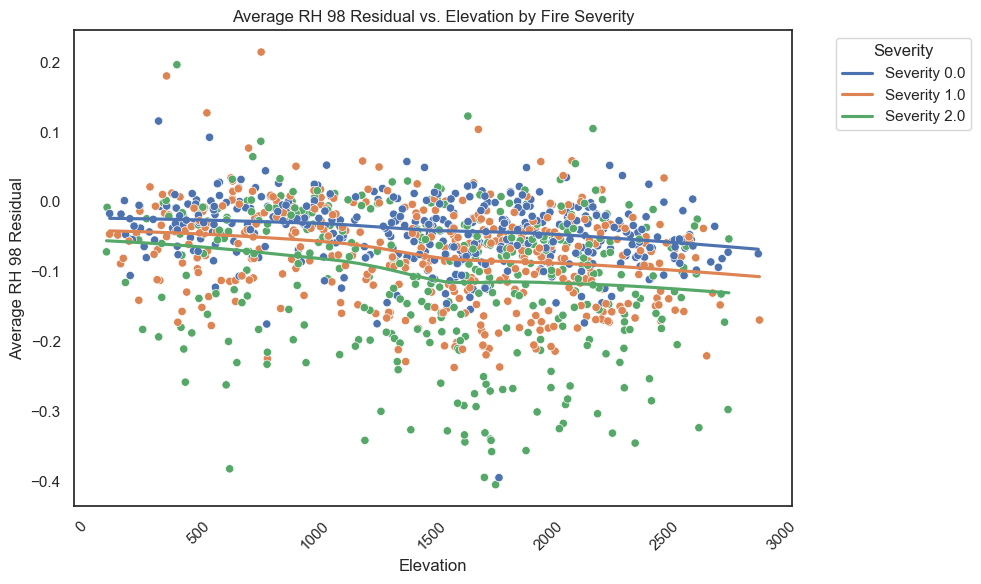

In [136]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='elevation', 
    y='ndvi_residual', 
    data=fire_stats, 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    sns.regplot(
        x='elevation', 
        y='ndvi_residual', 
        data=fire_stats[fire_stats['severity'] == severity], 
        scatter=False, 
        lowess=True, 
        color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}'
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Elevation')
plt.ylabel('Average RH 98 Residual')
plt.title('Average RH 98 Residual vs. Elevation by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


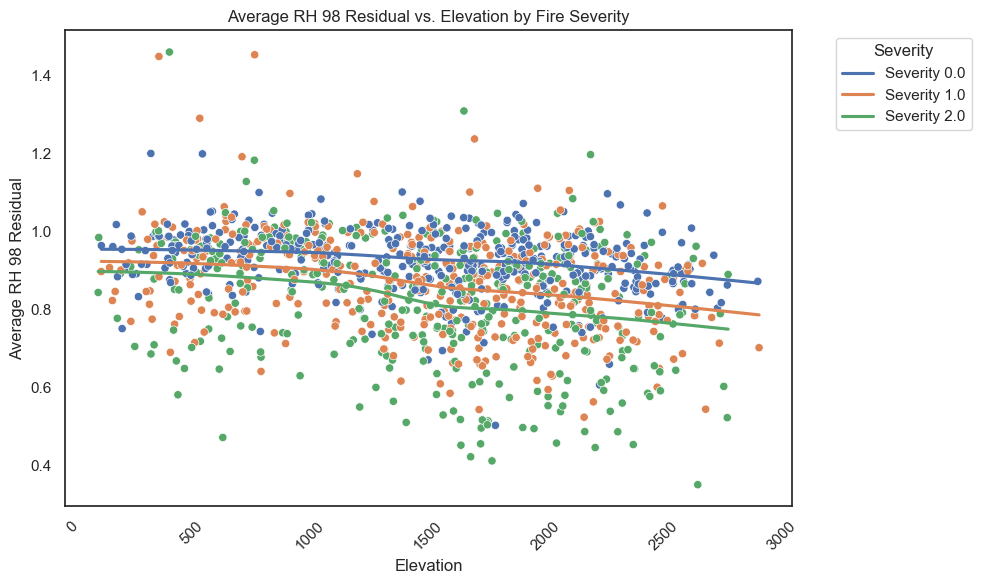

In [137]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='elevation', 
    y='ndvi_rel', 
    data=fire_stats, 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    sns.regplot(
        x='elevation', 
        y='ndvi_rel', 
        data=fire_stats[fire_stats['severity'] == severity], 
        scatter=False, 
        lowess=True, 
        color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}'
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Elevation')
plt.ylabel('Average RH 98 Residual')
plt.title('Average RH 98 Residual vs. Elevation by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


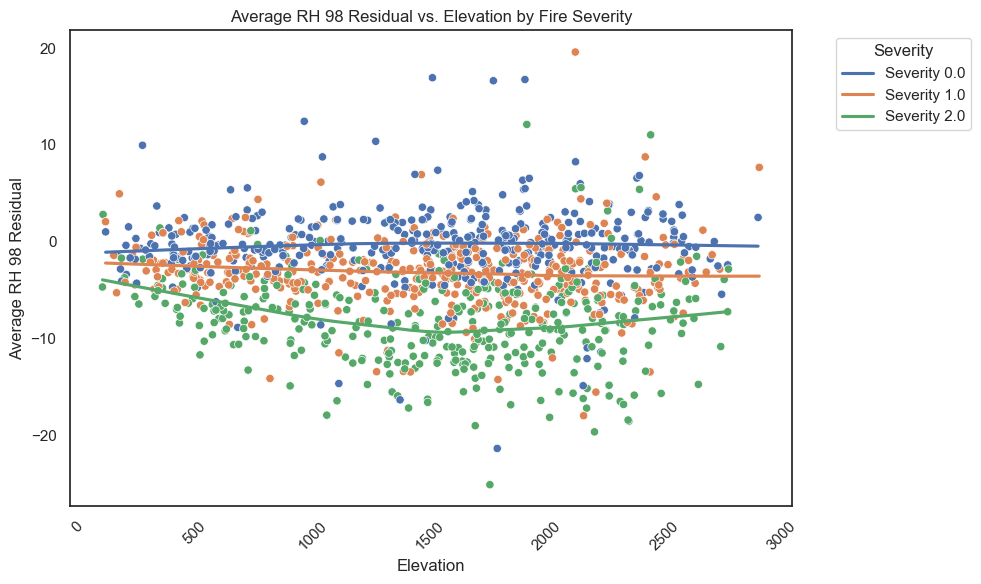

In [127]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='elevation', 
    y='rh_98_residual', 
    data=fire_stats, 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    sns.regplot(
        x='elevation', 
        y='rh_98_residual', 
        data=fire_stats[fire_stats['severity'] == severity], 
        scatter=False, 
        lowess=True, 
        color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}'
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Elevation')
plt.ylabel('Average RH 98 Residual')
plt.title('Average RH 98 Residual vs. Elevation by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


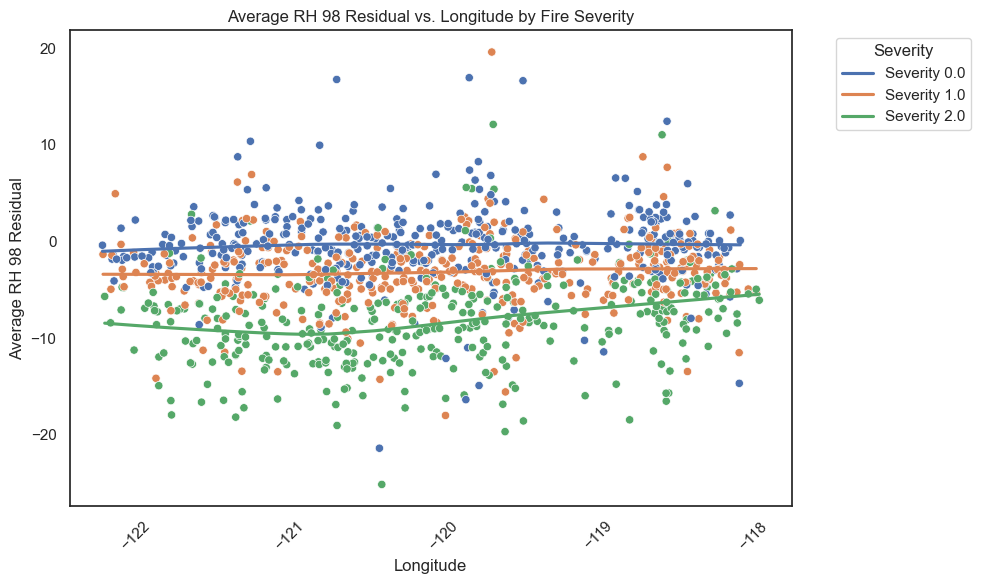

In [128]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='longitude', 
    y='rh_98_residual', 
    data=fire_stats, 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    sns.regplot(
        x='longitude', 
        y='rh_98_residual', 
        data=fire_stats[fire_stats['severity'] == severity], 
        scatter=False, 
        lowess=True, 
        color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}'
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Longitude')
plt.ylabel('Average RH 98 Residual')
plt.title('Average RH 98 Residual vs. Longitude by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


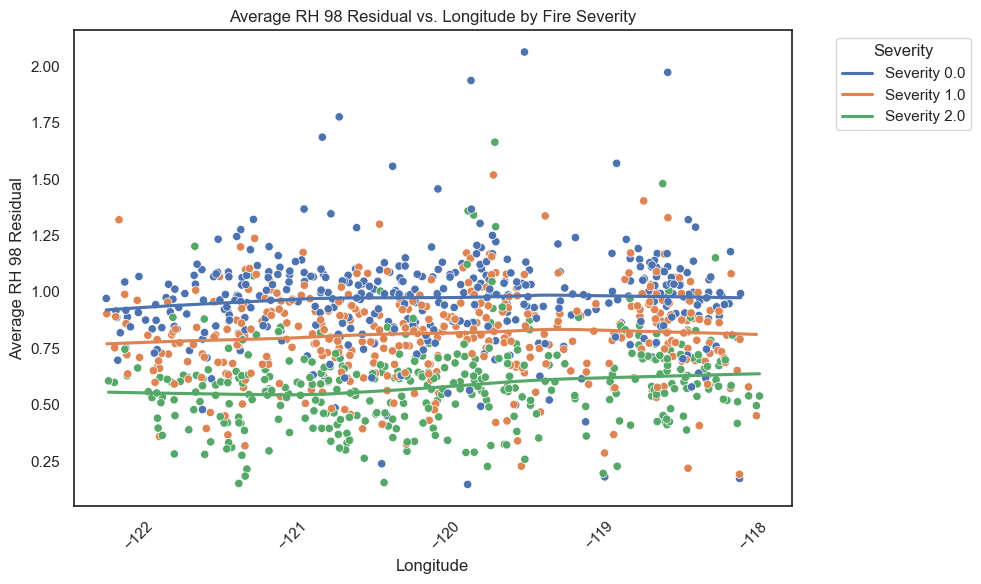

In [133]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='longitude', 
    y='rh_98_rel', 
    data=fire_stats, 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    sns.regplot(
        x='longitude', 
        y='rh_98_rel', 
        data=fire_stats[fire_stats['severity'] == severity], 
        scatter=False, 
        lowess=True, 
        color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}'
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Longitude')
plt.ylabel('Average RH 98 Residual')
plt.title('Average RH 98 Residual vs. Longitude by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


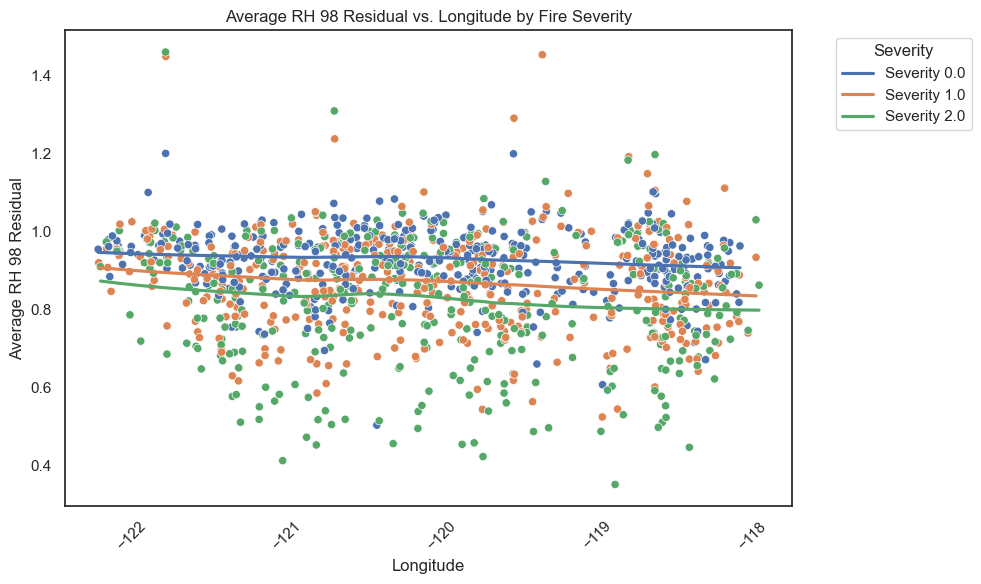

In [134]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='longitude', 
    y='ndvi_rel', 
    data=fire_stats, 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    sns.regplot(
        x='longitude', 
        y='ndvi_rel', 
        data=fire_stats[fire_stats['severity'] == severity], 
        scatter=False, 
        lowess=True, 
        color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}'
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Longitude')
plt.ylabel('Average RH 98 Residual')
plt.title('Average RH 98 Residual vs. Longitude by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


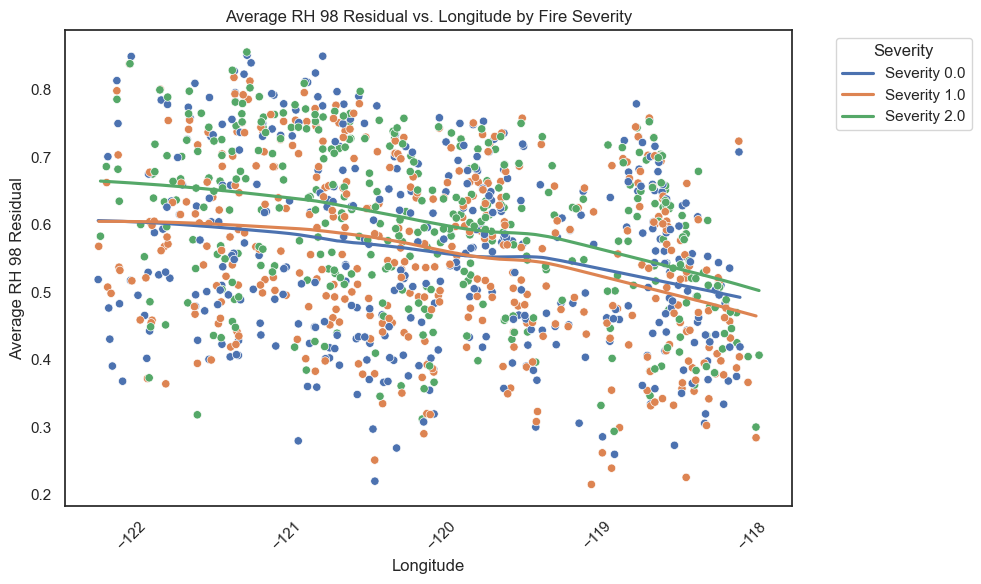

In [132]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='longitude', 
    y='pre_fire_ndvi', 
    data=fire_stats, 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    sns.regplot(
        x='longitude', 
        y='pre_fire_ndvi', 
        data=fire_stats[fire_stats['severity'] == severity], 
        scatter=False, 
        lowess=True, 
        color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}'
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Longitude')
plt.ylabel('Average RH 98 Residual')
plt.title('Average RH 98 Residual vs. Longitude by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


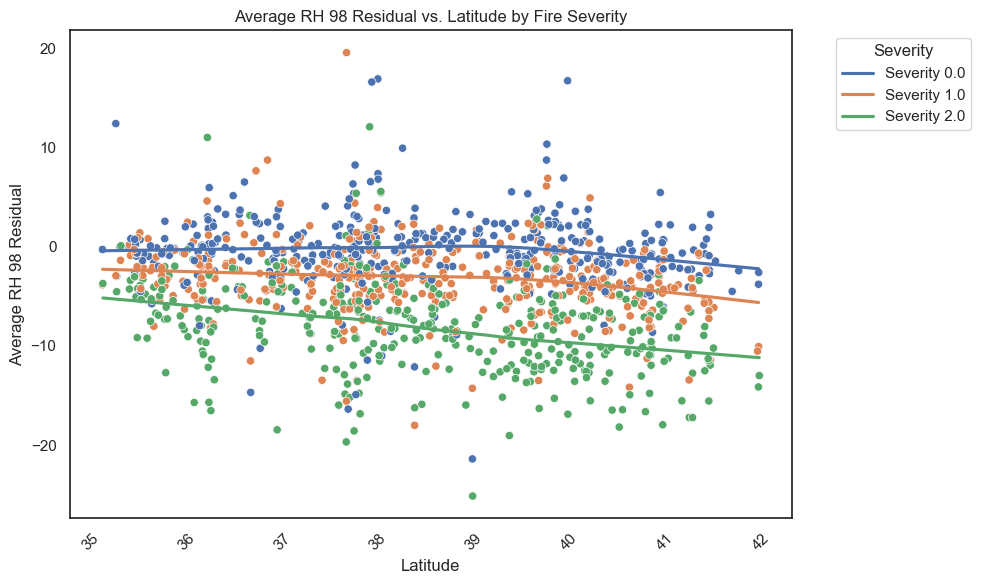

In [130]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='latitude', 
    y='rh_98_residual', 
    data=fire_stats, 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    sns.regplot(
        x='latitude', 
        y='rh_98_residual', 
        data=fire_stats[fire_stats['severity'] == severity], 
        scatter=False, 
        lowess=True, 
        color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}'
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Latitude')
plt.ylabel('Average RH 98 Residual')
plt.title('Average RH 98 Residual vs. Latitude by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


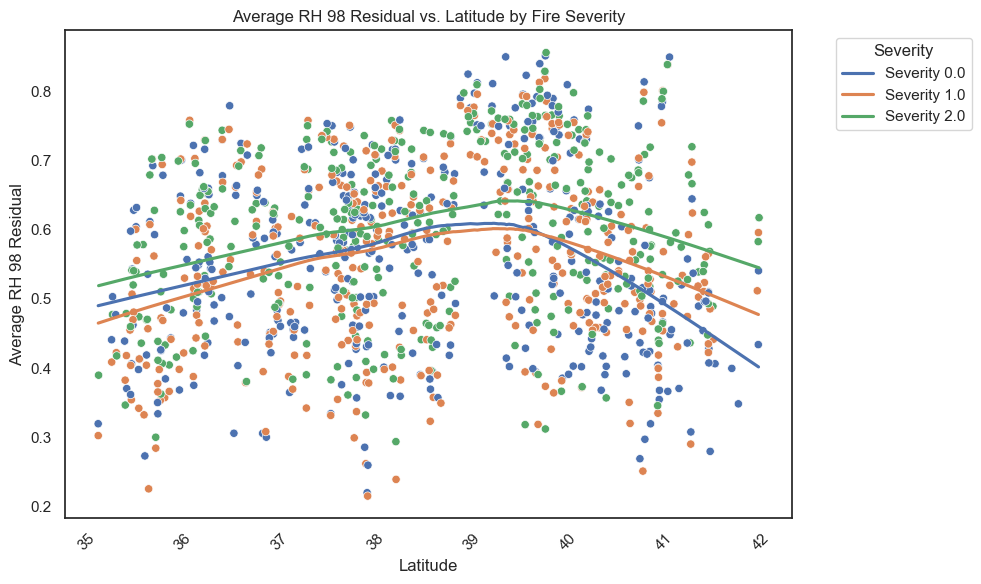

In [131]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='latitude', 
    y='pre_fire_ndvi', 
    data=fire_stats, 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    sns.regplot(
        x='latitude', 
        y='pre_fire_ndvi', 
        data=fire_stats[fire_stats['severity'] == severity], 
        scatter=False, 
        lowess=True, 
        color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}'
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Latitude')
plt.ylabel('Average RH 98 Residual')
plt.title('Average RH 98 Residual vs. Latitude by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


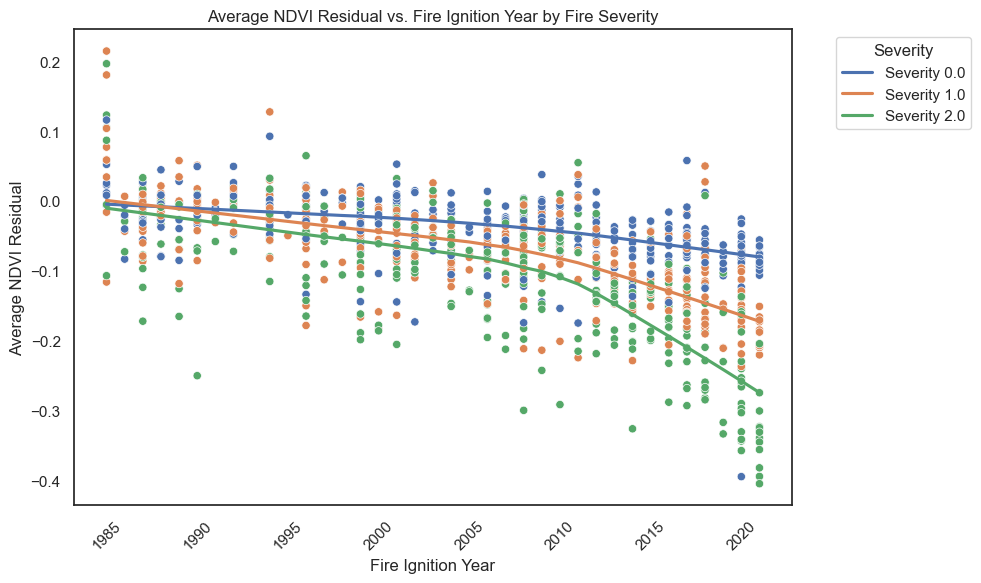

In [93]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Convert fire_ig_year to a continuous variable if it isn't already
fire_stats['fire_ig_year'] = pd.to_numeric(fire_stats['fire_ig_year'], errors='coerce')

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='fire_ig_year', 
    y='ndvi_residual', 
    data=fire_stats, 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    sns.regplot(
        x='fire_ig_year', 
        y='ndvi_residual', 
        data=fire_stats[fire_stats['severity'] == severity], 
        scatter=False, 
        lowess=True, 
        color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}'
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('Average NDVI Residual')
plt.title('Average NDVI Residual vs. Fire Ignition Year by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


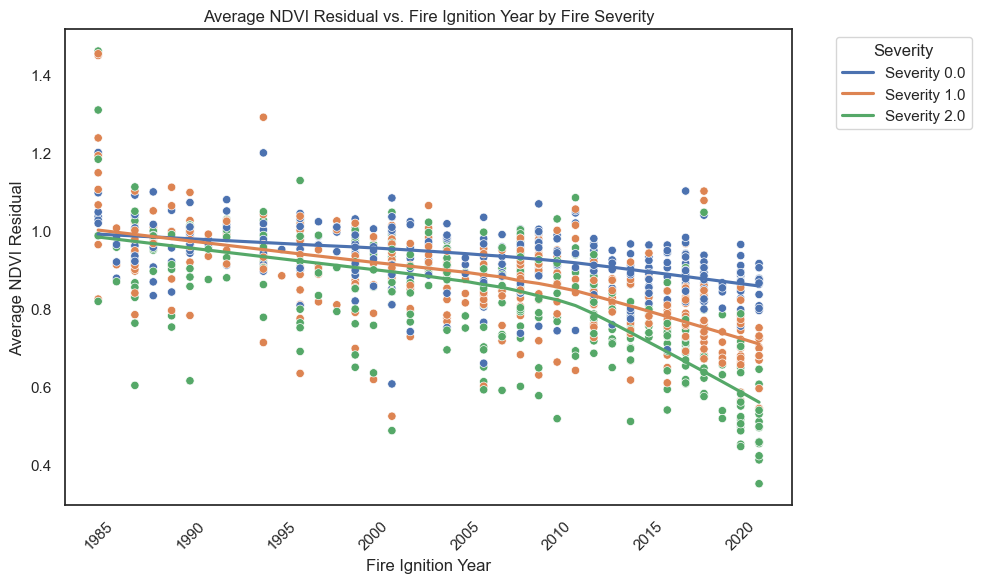

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Convert fire_ig_year to a continuous variable if it isn't already
fire_stats['fire_ig_year'] = pd.to_numeric(fire_stats['fire_ig_year'], errors='coerce')

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='fire_ig_year', 
    y='avg_ndvi_rel', 
    data=fire_stats, 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    sns.regplot(
        x='fire_ig_year', 
        y='avg_ndvi_rel', 
        data=fire_stats[fire_stats['severity'] == severity], 
        scatter=False, 
        lowess=True, 
        color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}'
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('Average NDVI Residual')
plt.title('Average NDVI Residual vs. Fire Ignition Year by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


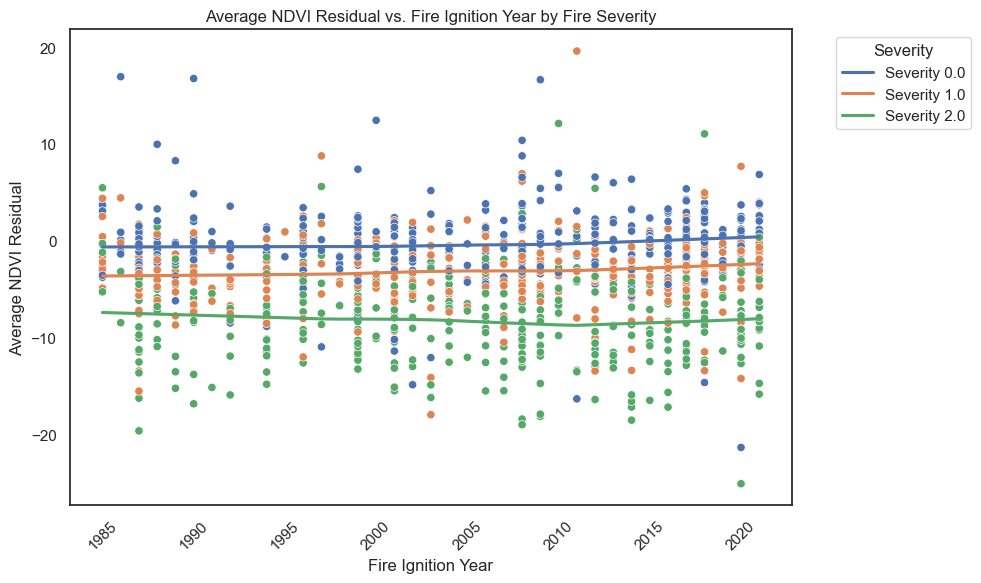

In [94]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Convert fire_ig_year to a continuous variable if it isn't already
fire_stats['fire_ig_year'] = pd.to_numeric(fire_stats['fire_ig_year'], errors='coerce')

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='fire_ig_year', 
    y='rh_98_residual', 
    data=fire_stats, 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    sns.regplot(
        x='fire_ig_year', 
        y='rh_98_residual', 
        data=fire_stats[fire_stats['severity'] == severity], 
        scatter=False, 
        lowess=True, 
        color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}'
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('Average NDVI Residual')
plt.title('Average NDVI Residual vs. Fire Ignition Year by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


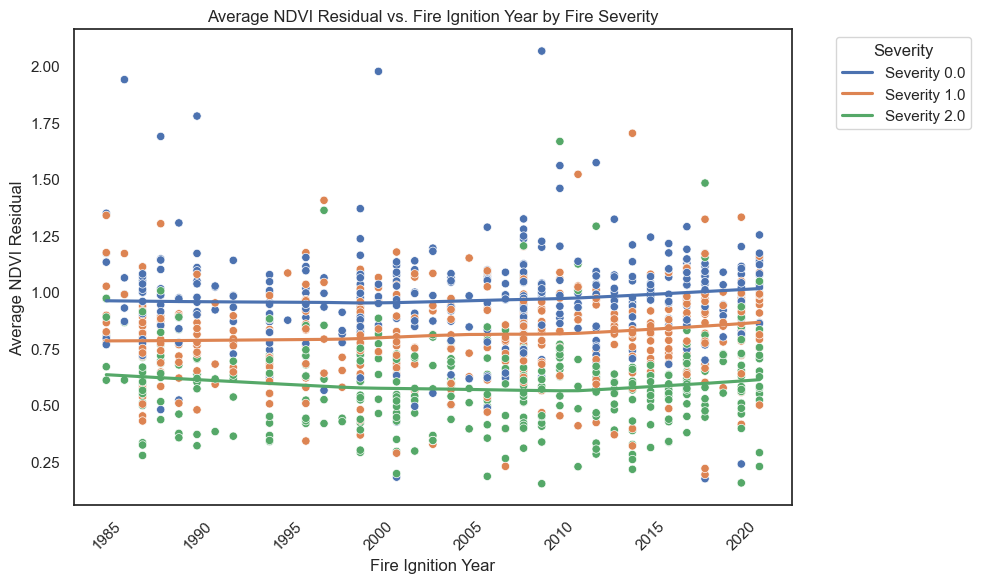

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Convert fire_ig_year to a continuous variable if it isn't already
fire_stats['fire_ig_year'] = pd.to_numeric(fire_stats['fire_ig_year'], errors='coerce')

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='fire_ig_year', 
    y='avg_rh_98_rel', 
    data=fire_stats, 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    sns.regplot(
        x='fire_ig_year', 
        y='avg_rh_98_rel', 
        data=fire_stats[fire_stats['severity'] == severity], 
        scatter=False, 
        lowess=True, 
        color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}'
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('Average NDVI Residual')
plt.title('Average NDVI Residual vs. Fire Ignition Year by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


<Figure size 1000x600 with 0 Axes>

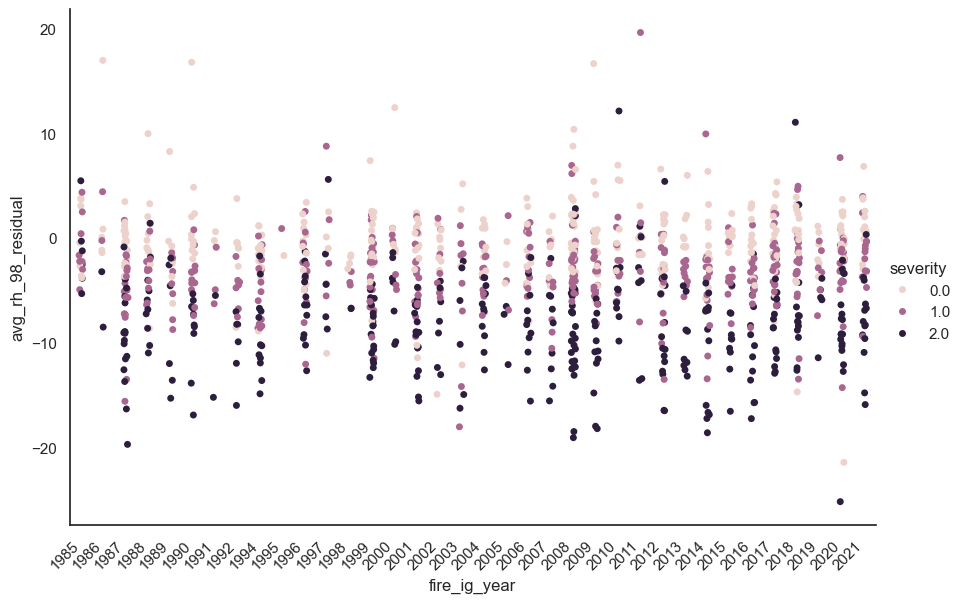

In [27]:
plt.figure(figsize=(10, 6))
g = sns.catplot(x='fire_ig_year', y='avg_rh_98_residual', data=fire_stats, kind='strip', height=6, aspect=1.5, hue="severity")
g.set_xticklabels(rotation=45, ha='right')

<Figure size 1000x600 with 0 Axes>

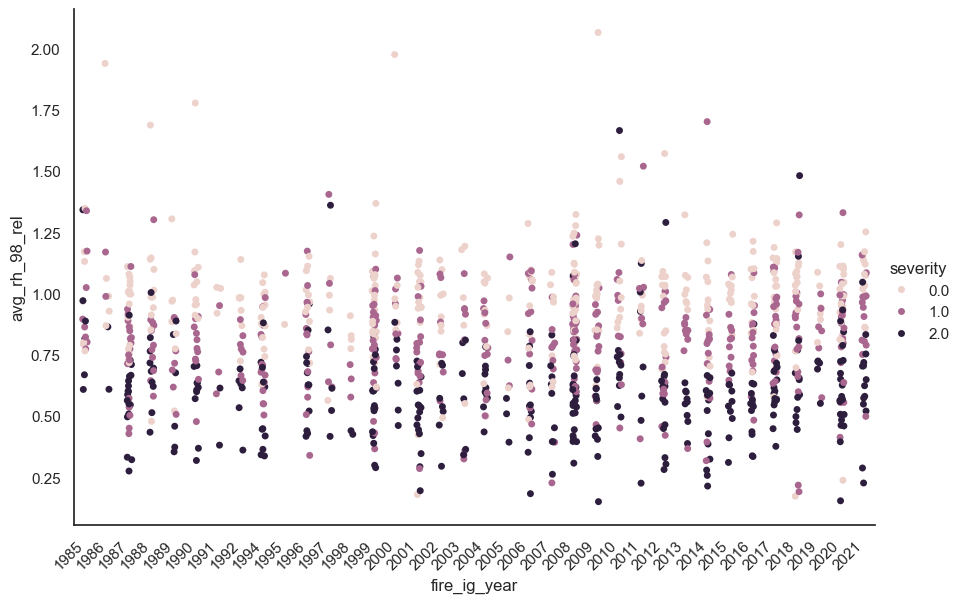

In [28]:
plt.figure(figsize=(10, 6))
g = sns.catplot(x='fire_ig_year', y='avg_rh_98_rel', data=fire_stats, kind='strip', height=6, aspect=1.5, hue="severity")
g.set_xticklabels(rotation=45, ha='right')

In [33]:
fire_stats.sort_values("avg_rh_98_rel", ascending=False).head(20)

,fire_name,fire_ig_date,severity,avg_ndvi_residual,avg_ndvi_rel,avg_rh_98_residual,avg_rh_98_rel,fire_ig_year
1126,WILDCAT,2009-07-29,0.0,-0.000903,0.998351,16.619046,2.064576,2009
801,PEAK,2000-08-02,0.0,-0.032940,0.928098,12.427918,1.974639,2000
372,ELEANOR,1986-09-27,0.0,-0.083319,0.878520,16.932839,1.938255,1986
1090,WALKER,1990-08-06,0.0,0.049257,1.072816,16.746244,1.776953,1990
476,GULCH,2014-09-10,1.0,-0.082431,0.863557,9.918474,1.700877,2014
792,PARDEE,1988-06-28,0.0,-0.079774,0.833838,9.947424,1.686855,1988
975,SLOPE,2010-07-25,2.0,-0.071195,0.882685,12.102343,1.664684,2010
541,INDIAN,2012-08-08,0.0,-0.043755,0.846546,6.563006,1.570845,2012
688,MCDONALD,2010-07-26,0.0,-0.006118,0.979616,5.475479,1.557873,2010
41,AVALANCHE,2011-07-31,1.0,-0.112586,0.841587,19.585466,1.519170,2011


In [61]:
sample_counts = df.groupby(['fire_name', 'fire_ig_year', 'severity']).size().reset_index(name='sample_count')

# Merge this count back into your fire_stats
fire_stats = fire_stats.merge(sample_counts, on=['fire_name', 'fire_ig_year', 'severity'])

In [62]:
sample_counts = df.groupby(['fire_name', 'fire_ig_year', 'severity']).size().reset_index(name='sample_count')

# Merge this count back into your fire_stats
fire_stats = fire_stats.merge(sample_counts, on=['fire_name', 'fire_ig_year', 'severity'])
fire_stats = df.groupby(['fire_name', 'fire_ig_year', 'severity']).agg(
    avg_ndvi_residual=('ndvi_residual', 'mean'),
    avg_ndvi_rel=('ndvi_rel', 'mean'),
    avg_rh_98_residual=('rh_98_residual', 'mean'),
    avg_rh_98_rel=('rh_98_rel', 'mean'),
    sample_count=('ndvi_residual', 'size')  # Count the number of samples per group
).reset_index()

In [43]:
fire_stats

,fire_name,fire_ig_year,severity,avg_ndvi_residual,avg_ndvi_rel,avg_rh_98_residual,avg_rh_98_rel,sample_count
0,1-12,2020,0.0,-0.025885,0.965137,2.108537,1.099057,2
1,49R,1988,0.0,-0.008631,0.986713,-0.219670,0.985438,1562
2,49R,1988,1.0,0.007190,1.012025,-2.249415,0.869713,649
3,49R,1988,2.0,-0.011190,0.984183,-5.914039,0.695489,2605
4,A-ROCK,1990,0.0,-0.033852,0.942696,2.030622,1.106979,85
...,...,...,...,...,...,...,...,...
1148,YUBA RIVER COMPLEX (FALL),2008,1.0,-0.037823,0.950037,-1.631571,0.957339,39
1149,YUBA RIVER COMPLEX (FALL),2008,2.0,-0.049233,0.933041,-19.034342,0.307611,125
1150,YUBA RIVER COMPLEX (SCOTCHMAN),2008,0.0,-0.112930,0.864505,-2.927078,0.925001,15
1151,YUBA RIVER COMPLEX (SCOTCHMAN),2008,1.0,-0.096673,0.848041,-5.252085,0.791207,8


In [44]:
fire_stats.sort_values("avg_rh_98_rel", ascending=False).head(20)

,fire_name,fire_ig_year,severity,avg_ndvi_residual,avg_ndvi_rel,avg_rh_98_residual,avg_rh_98_rel,sample_count
1116,WILDCAT,2009,0.0,-0.000903,0.998351,16.619046,2.064576,1
796,PEAK,2000,0.0,-0.032940,0.928098,12.427918,1.974639,3
369,ELEANOR,1986,0.0,-0.083319,0.878520,16.932839,1.938255,1
1080,WALKER,1990,0.0,0.049257,1.072816,16.746244,1.776953,1
787,PARDEE,1988,0.0,-0.079774,0.833838,9.947424,1.686855,1
968,SLOPE,2010,2.0,-0.071195,0.882685,12.102343,1.664684,1
536,INDIAN,2012,0.0,-0.043755,0.846546,6.563006,1.570845,1
683,MCDONALD,2010,0.0,-0.006118,0.979616,5.475479,1.557873,12
41,AVALANCHE,2011,1.0,-0.112586,0.841587,19.585466,1.519170,1
742,MOUNTAINEER FIRE,2018,2.0,-0.284812,0.577987,11.027314,1.480646,1


In [95]:
fire_stats

,fire_name,fire_ig_year,severity,ndvi_residual,ndvi_rel,rh_98_residual,rh_98_rel,sample_count,dnbr_mean
0,1-12,2020,0.0,-0.025885,0.965137,2.108537,1.099057,2,38.000000
1,49R,1988,0.0,-0.008831,0.986419,-0.256676,0.982788,1526,29.175623
2,49R,1988,1.0,0.007190,1.012025,-2.249415,0.869713,649,283.784669
3,49R,1988,2.0,-0.011190,0.984183,-5.914039,0.695489,2605,550.200096
4,A-ROCK,1990,0.0,-0.033634,0.943083,1.969767,1.102479,84,73.279762
...,...,...,...,...,...,...,...,...,...
1148,YUBA RIVER COMPLEX (FALL),2008,1.0,-0.037823,0.950037,-1.631571,0.957339,39,254.166667
1149,YUBA RIVER COMPLEX (FALL),2008,2.0,-0.049233,0.933041,-19.034342,0.307611,125,635.652000
1150,YUBA RIVER COMPLEX (SCOTCHMAN),2008,0.0,-0.112930,0.864505,-2.927078,0.925001,15,65.783333
1151,YUBA RIVER COMPLEX (SCOTCHMAN),2008,1.0,-0.096673,0.848041,-5.252085,0.791207,8,301.875000


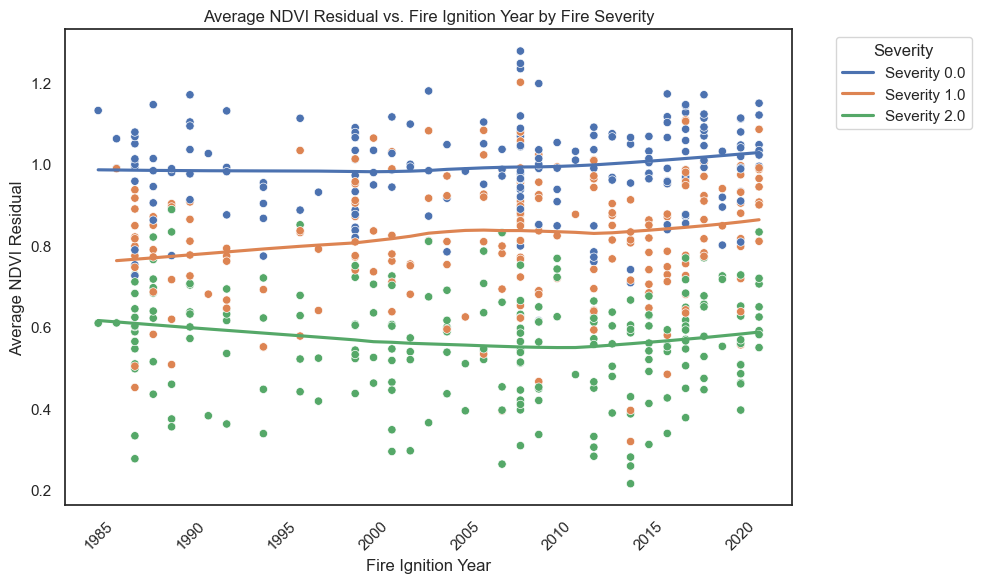

In [96]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='fire_ig_year', 
    y='rh_98_rel', 
    data=fire_stats[fire_stats.sample_count > 50], 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    sns.regplot(
        x='fire_ig_year', 
        y='rh_98_rel', 
        data=fire_stats[(fire_stats['severity'] == severity) & (fire_stats.sample_count > 50)], 
        scatter=False, 
        lowess=True, 
        color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}'
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('Average NDVI Residual')
plt.title('Average NDVI Residual vs. Fire Ignition Year by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


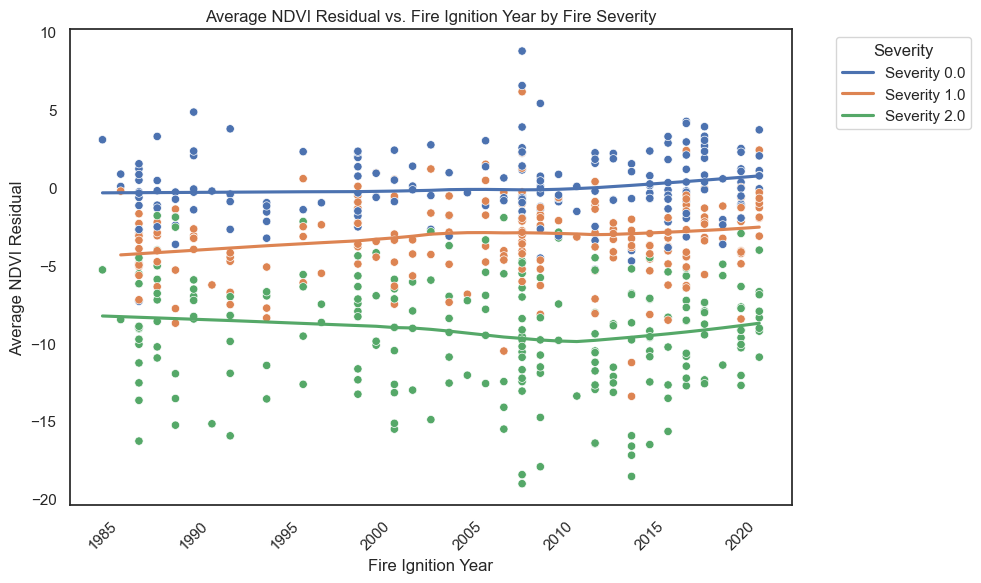

In [71]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='fire_ig_year', 
    y='avg_rh_98_residual', 
    data=fire_stats[fire_stats.sample_count > 50], 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    subset=fire_stats[(fire_stats['severity'] == severity) & (fire_stats.sample_count > 50)]
    sns.regplot(
        x='fire_ig_year', y='avg_rh_98_residual', data=subset,
        scatter=False, lowess=True,         color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}', ci=95  # Default is 95% confidence interval, adjust as needed
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('Average NDVI Residual')
plt.title('Average NDVI Residual vs. Fire Ignition Year by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


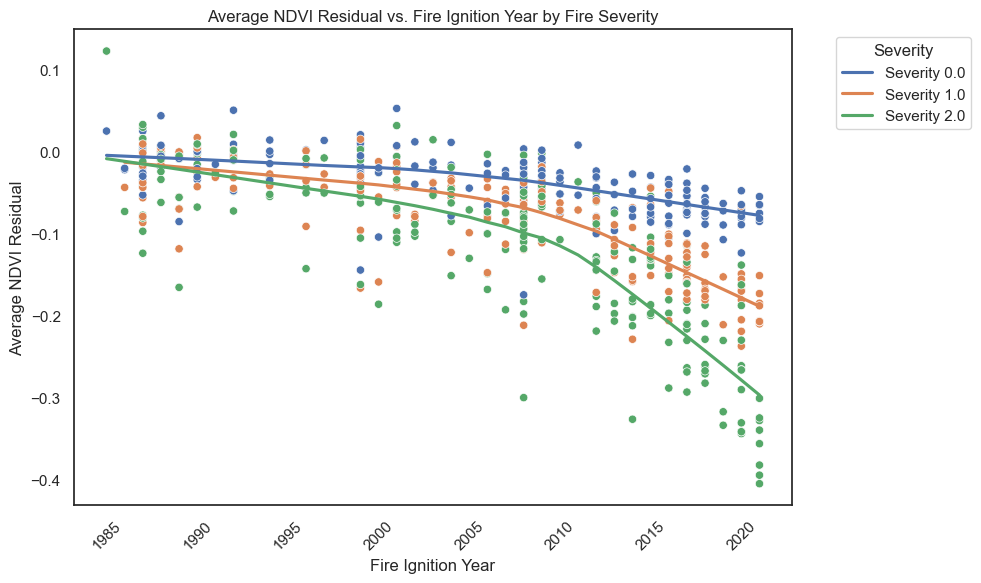

In [73]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='fire_ig_year', 
    y='avg_ndvi_residual', 
    data=fire_stats[fire_stats.sample_count > 50], 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    subset=fire_stats[(fire_stats['severity'] == severity) & (fire_stats.sample_count > 50)]
    sns.regplot(
        x='fire_ig_year', y='avg_ndvi_residual', data=subset,
        scatter=False, lowess=True,         color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}', ci=95  # Default is 95% confidence interval, adjust as needed
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('Average NDVI Residual')
plt.title('Average NDVI Residual vs. Fire Ignition Year by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


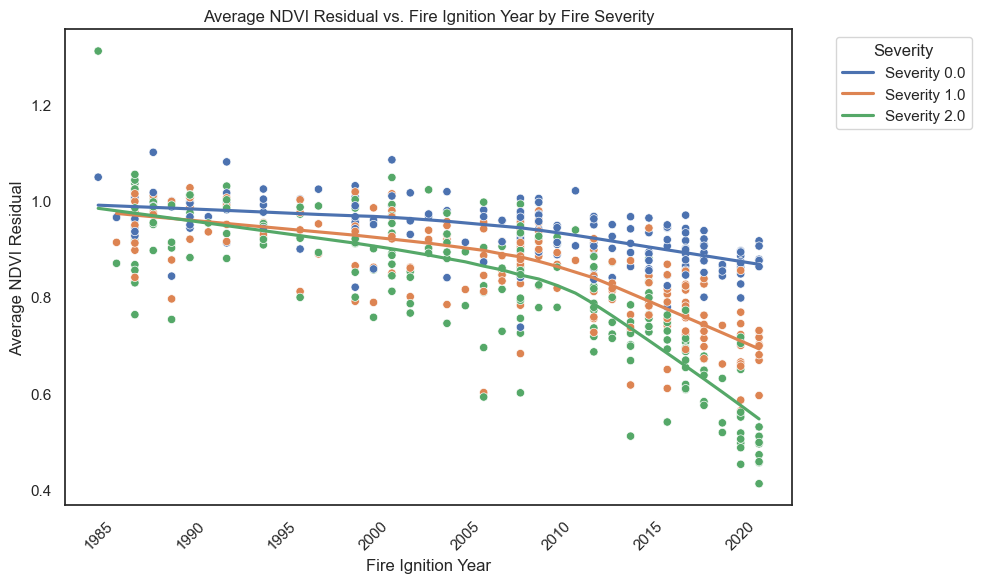

In [74]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='fire_ig_year', 
    y='avg_ndvi_rel', 
    data=fire_stats[fire_stats.sample_count > 50], 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    subset=fire_stats[(fire_stats['severity'] == severity) & (fire_stats.sample_count > 50)]
    sns.regplot(
        x='fire_ig_year', y='avg_ndvi_rel', data=subset,
        scatter=False, lowess=True,         color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}', ci=95  # Default is 95% confidence interval, adjust as needed
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('Average NDVI Residual')
plt.title('Average NDVI Residual vs. Fire Ignition Year by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


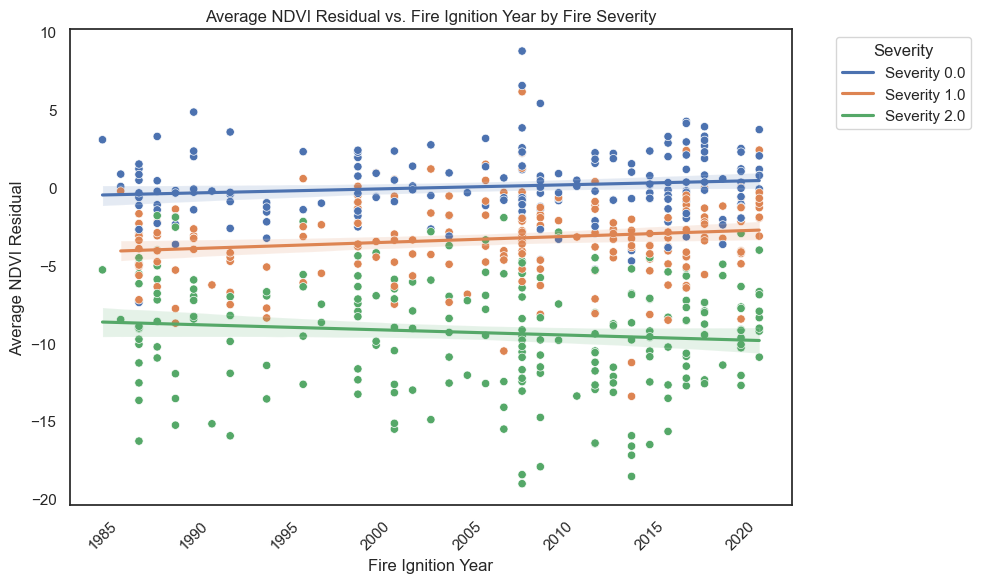

In [116]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='fire_ig_year', 
    y='rh_98_residual', 
    data=fire_stats[fire_stats.sample_count > 50], 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    subset=fire_stats[(fire_stats['severity'] == severity) & (fire_stats.sample_count > 50)]
    sns.regplot(
        x='fire_ig_year', y='rh_98_residual', data=subset,
        scatter=False, lowess=False,         color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}', ci=95  # Default is 95% confidence interval, adjust as needed
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('Average NDVI Residual')
plt.title('Average NDVI Residual vs. Fire Ignition Year by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


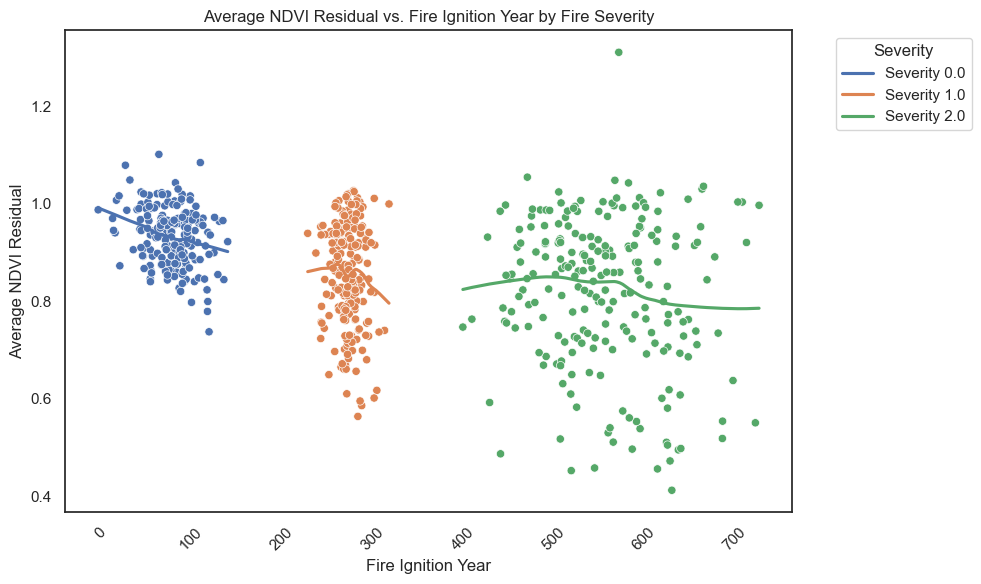

In [97]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='dnbr_mean', 
    y='ndvi_rel', 
    data=fire_stats[fire_stats.sample_count > 50], 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    subset=fire_stats[(fire_stats['severity'] == severity) & (fire_stats.sample_count > 50)]
    sns.regplot(
        x='dnbr_mean', y='ndvi_rel', data=subset,
        scatter=False, lowess=True,         color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}', ci=95  # Default is 95% confidence interval, adjust as needed
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('Average NDVI Residual')
plt.title('Average NDVI Residual vs. Fire Ignition Year by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


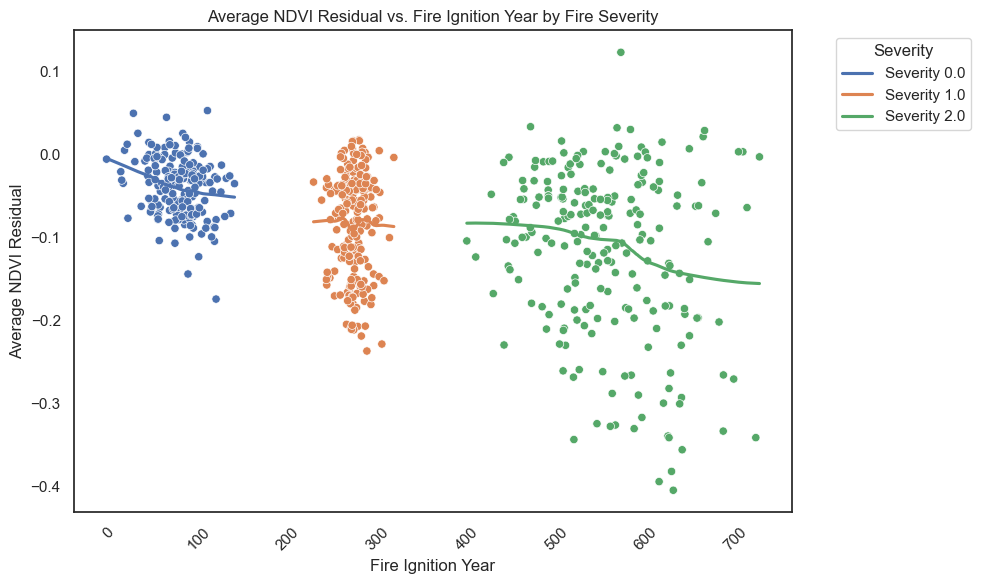

In [98]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='dnbr_mean', 
    y='ndvi_residual', 
    data=fire_stats[fire_stats.sample_count > 50], 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    subset=fire_stats[(fire_stats['severity'] == severity) & (fire_stats.sample_count > 50)]
    sns.regplot(
        x='dnbr_mean', y='ndvi_residual', data=subset,
        scatter=False, lowess=True,         color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}', ci=95  # Default is 95% confidence interval, adjust as needed
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('Average NDVI Residual')
plt.title('Average NDVI Residual vs. Fire Ignition Year by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


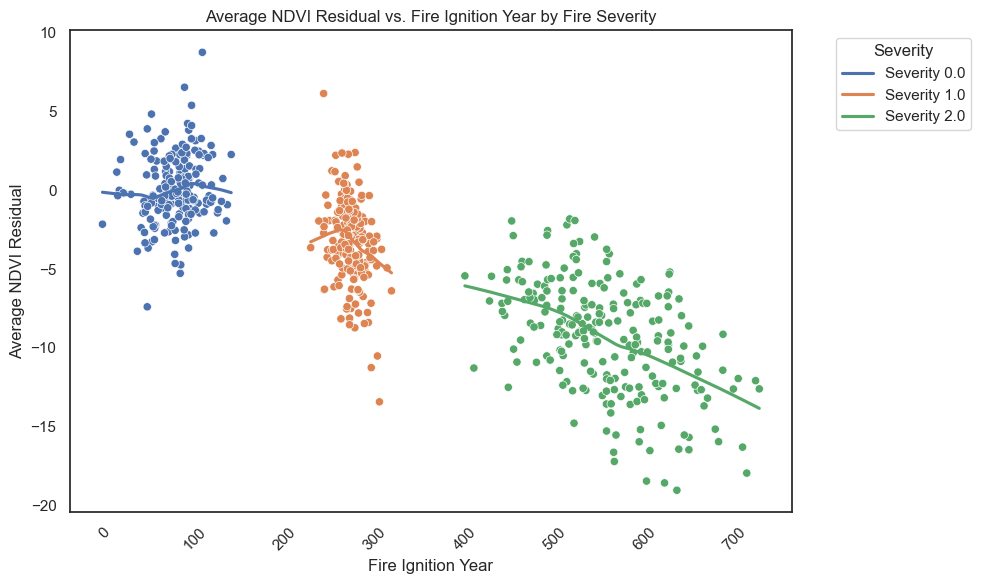

In [99]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))

# Create a scatter plot for each severity category with regression lines
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='dnbr_mean', 
    y='rh_98_residual', 
    data=fire_stats[fire_stats.sample_count > 50], 
    hue='severity', 
    palette=severity_colors,
    legend=False
)

# Loop through each severity category and add a regression line with consistent colors
for severity in fire_stats['severity'].unique():
    subset=fire_stats[(fire_stats['severity'] == severity) & (fire_stats.sample_count > 50)]
    sns.regplot(
        x='dnbr_mean', y='rh_98_residual', data=subset,
        scatter=False, lowess=True,         color=severity_colors[severity],  # Ensure the line color matches the scatterplot
        label=f'Severity {severity}', ci=95  # Default is 95% confidence interval, adjust as needed
    )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('Average NDVI Residual')
plt.title('Average NDVI Residual vs. Fire Ignition Year by Fire Severity')

# Add legend outside the plot
plt.legend(title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


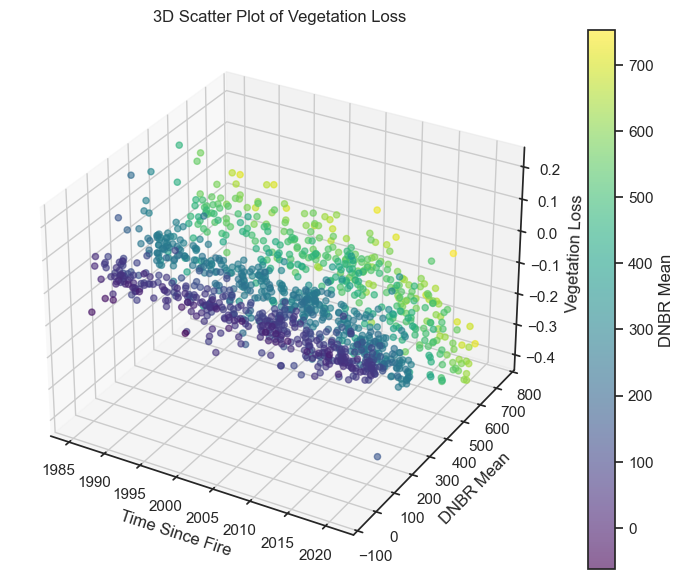

In [100]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

# Assuming 'df' has 'time_since_fire', 'dnbr_mean', and 'veg_loss' columns

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
sc = ax.scatter(fire_stats['fire_ig_year'], fire_stats['dnbr_mean'], fire_stats['ndvi_residual'], c=fire_stats['dnbr_mean'], cmap='viridis', alpha=0.6)

# Labels
ax.set_xlabel('Time Since Fire')
ax.set_ylabel('DNBR Mean')
ax.set_zlabel('Vegetation Loss')

# Color bar
plt.colorbar(sc, ax=ax, label='DNBR Mean')

plt.title('3D Scatter Plot of Vegetation Loss')
plt.show()

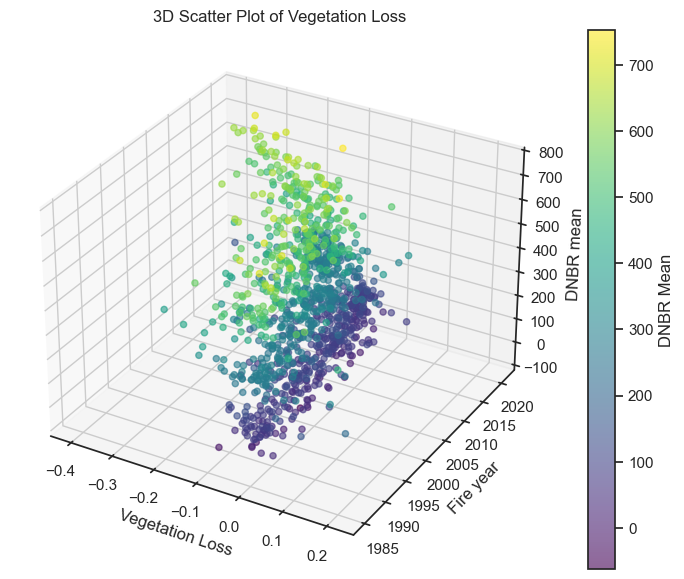

In [103]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

# Assuming 'df' has 'time_since_fire', 'dnbr_mean', and 'veg_loss' columns

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
sc = ax.scatter(fire_stats['ndvi_residual'], fire_stats['fire_ig_year'], fire_stats['dnbr_mean'], c=fire_stats['dnbr_mean'], cmap='viridis', alpha=0.6)

# Labels
ax.set_xlabel('Vegetation Loss')
ax.set_ylabel('Fire year')
ax.set_zlabel('DNBR mean')

# Color bar
plt.colorbar(sc, ax=ax, label='DNBR Mean')

plt.title('3D Scatter Plot of Vegetation Loss')
plt.show()

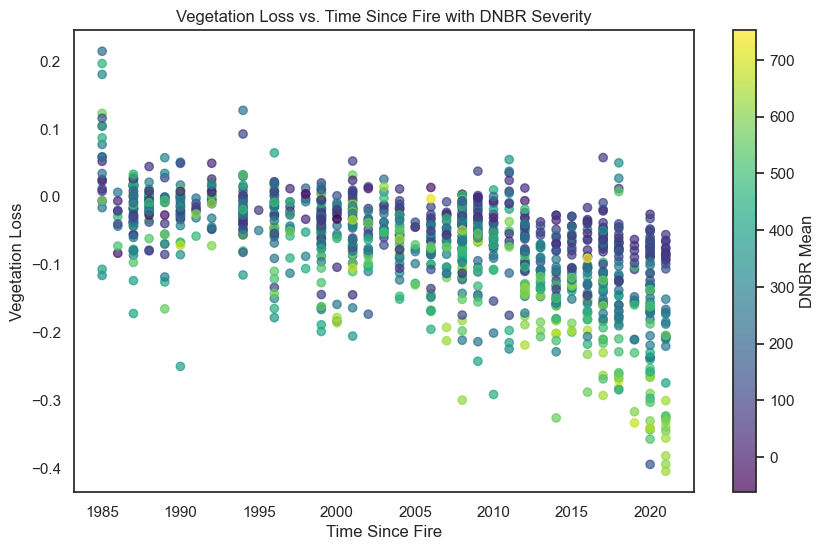

In [107]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' has 'time_since_fire', 'dnbr_mean', and 'veg_loss' columns

plt.figure(figsize=(10, 6))
scatter = plt.scatter(fire_stats['fire_ig_year'], fire_stats['ndvi_residual'], c=fire_stats['dnbr_mean'], cmap='viridis', alpha=0.7)
plt.colorbar(scatter, label='DNBR Mean')

plt.xlabel('Time Since Fire')
plt.ylabel('Vegetation Loss')
plt.title('Vegetation Loss vs. Time Since Fire with DNBR Severity')

plt.show()

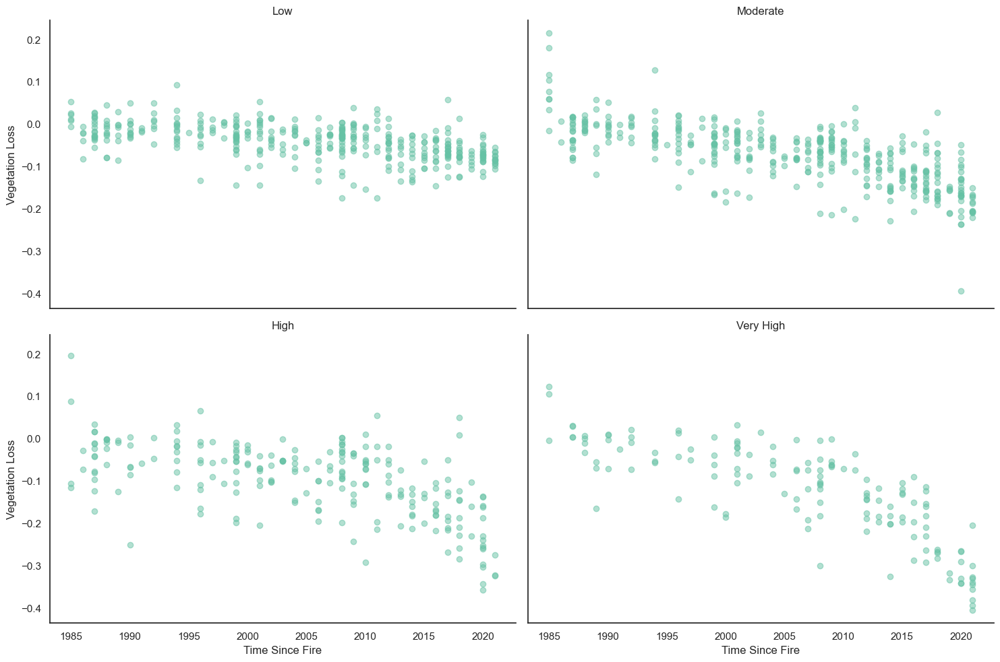

In [108]:
import seaborn as sns
import matplotlib.pyplot as plt

# Bin the 'dnbr_mean' into categories for better visualization
fire_stats['dnbr_category'] = pd.cut(fire_stats['dnbr_mean'], bins=4, labels=['Low', 'Moderate', 'High', 'Very High'])

g = sns.FacetGrid(fire_stats, col='dnbr_category', col_wrap=2, height=5, aspect=1.5)
g.map(plt.scatter, 'fire_ig_year', 'ndvi_residual', alpha=0.5)

# Adding titles and labels
g.set_titles("{col_name}")
g.set_axis_labels("Time Since Fire", "Vegetation Loss")

plt.show()

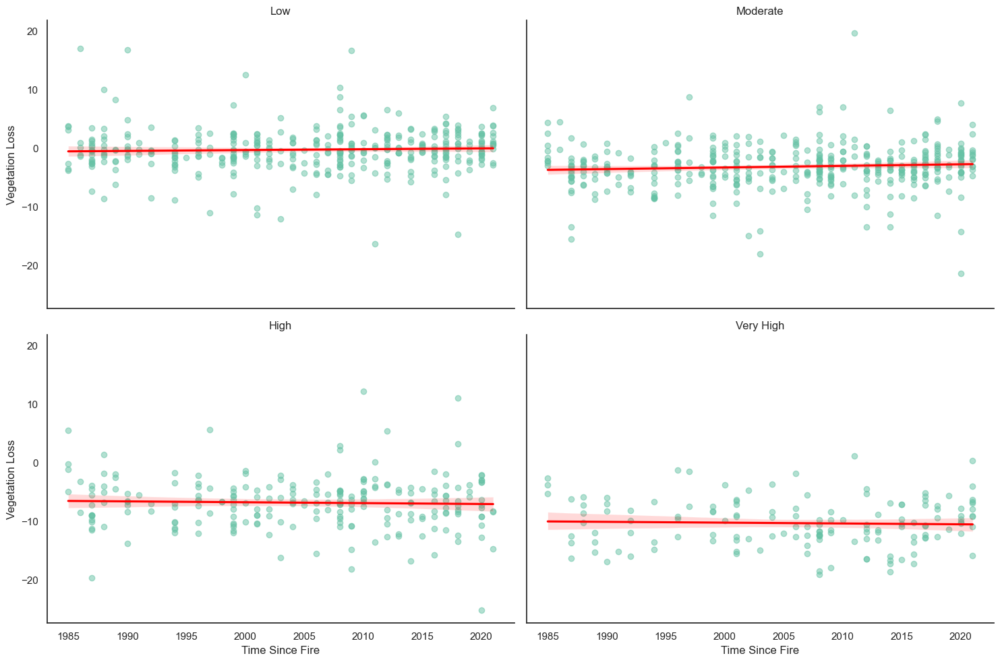

In [114]:
import seaborn as sns
import matplotlib.pyplot as plt

# Bin the 'dnbr_mean' into categories for better visualization
fire_stats['dnbr_category'] = pd.cut(fire_stats['dnbr_mean'], bins=4, labels=['Low', 'Moderate', 'High', 'Very High'])

g = sns.FacetGrid(fire_stats, col='dnbr_category', col_wrap=2, height=5, aspect=1.5)
g.map(sns.regplot, 'fire_ig_year', 'rh_98_residual', scatter_kws={'alpha': 0.5}, line_kws={'color': 'red'})

# Adding titles and labels
g.set_titles("{col_name}")
g.set_axis_labels("Time Since Fire", "Vegetation Loss")

plt.show()

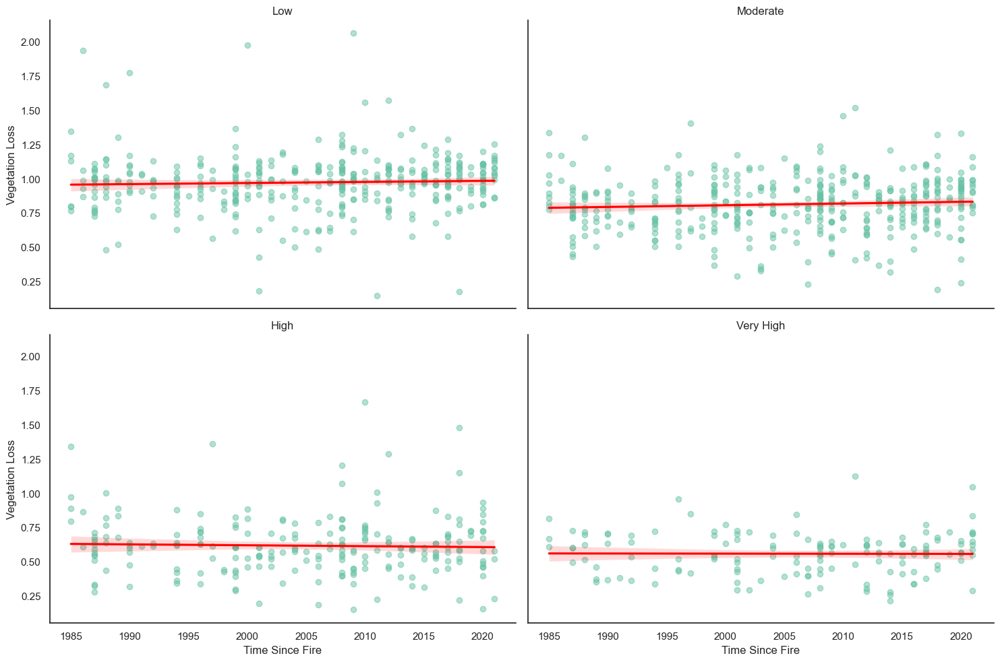

In [113]:
import seaborn as sns
import matplotlib.pyplot as plt

# Bin the 'dnbr_mean' into categories for better visualization
fire_stats['dnbr_category'] = pd.cut(fire_stats['dnbr_mean'], bins=4, labels=['Low', 'Moderate', 'High', 'Very High'])

g = sns.FacetGrid(fire_stats, col='dnbr_category', col_wrap=2, height=5, aspect=1.5)
g.map(sns.regplot, 'fire_ig_year', 'rh_98_rel', scatter_kws={'alpha': 0.5}, line_kws={'color': 'red'})

# Adding titles and labels
g.set_titles("{col_name}")
g.set_axis_labels("Time Since Fire", "Vegetation Loss")

plt.show()

/maps/fire-regen/fire_env/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


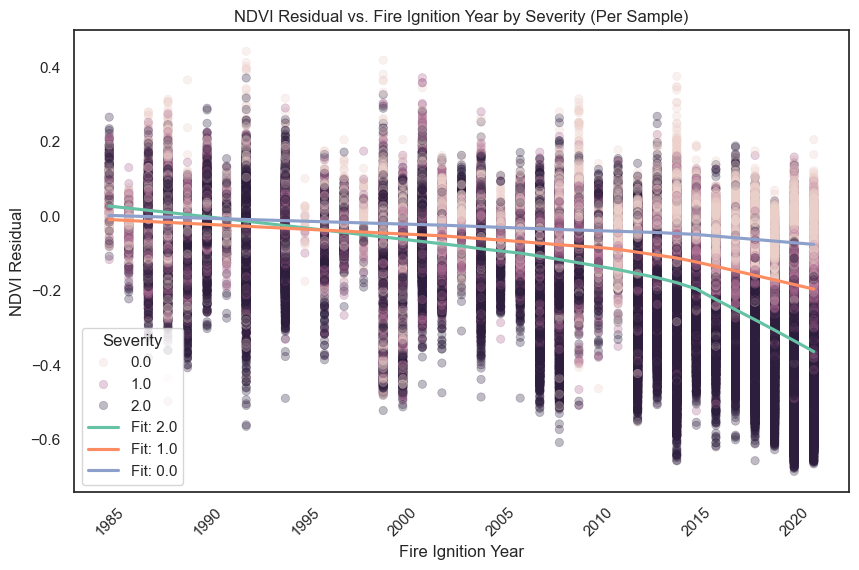

In [72]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='fire_ig_year', y='ndvi_residual', data=df, hue='severity', alpha=0.3, edgecolor=None)

# Optionally add a lowess fit line if you want to visualize trends, though it may clutter the plot with individual points
for severity in df['severity'].unique():
    subset = df[df['severity'] == severity]
    sns.regplot(
        x='fire_ig_year', y='ndvi_residual', data=subset,
        scatter=False, lowess=True, label=f"Fit: {severity}", ci=None  # No CI for clarity in this context
    )

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('NDVI Residual')
plt.title('NDVI Residual vs. Fire Ignition Year by Severity (Per Sample)')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show plot
plt.legend(title="Severity")
plt.show()

/maps/fire-regen/fire_env/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


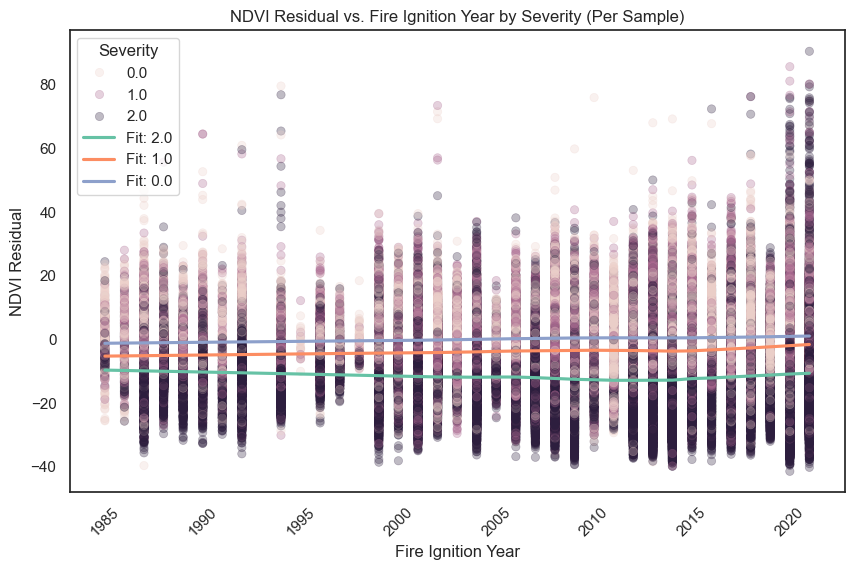

In [75]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='fire_ig_year', y='rh_98_residual', data=df, hue='severity', alpha=0.3, edgecolor=None)

# Optionally add a lowess fit line if you want to visualize trends, though it may clutter the plot with individual points
for severity in df['severity'].unique():
    subset = df[df['severity'] == severity]
    sns.regplot(
        x='fire_ig_year', y='rh_98_residual', data=subset,
        scatter=False, lowess=True, label=f"Fit: {severity}", ci=None  # No CI for clarity in this context
    )

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('NDVI Residual')
plt.title('NDVI Residual vs. Fire Ignition Year by Severity (Per Sample)')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show plot
plt.legend(title="Severity")
plt.show()

/maps/fire-regen/fire_env/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


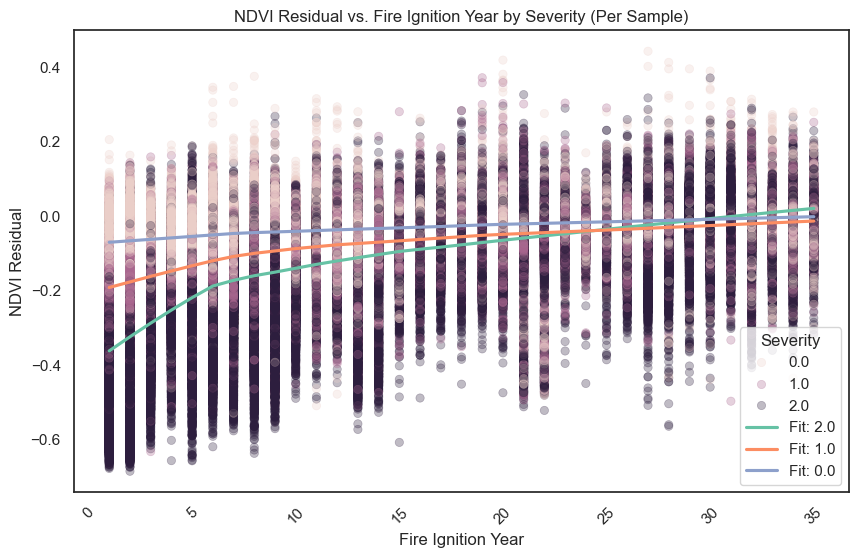

In [76]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='YSF', y='ndvi_residual', data=df, hue='severity', alpha=0.3, edgecolor=None)

# Optionally add a lowess fit line if you want to visualize trends, though it may clutter the plot with individual points
for severity in df['severity'].unique():
    subset = df[df['severity'] == severity]
    sns.regplot(
        x='YSF', y='ndvi_residual', data=subset,
        scatter=False, lowess=True, label=f"Fit: {severity}", ci=None  # No CI for clarity in this context
    )

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('NDVI Residual')
plt.title('NDVI Residual vs. Fire Ignition Year by Severity (Per Sample)')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show plot
plt.legend(title="Severity")
plt.show()

/maps/fire-regen/fire_env/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


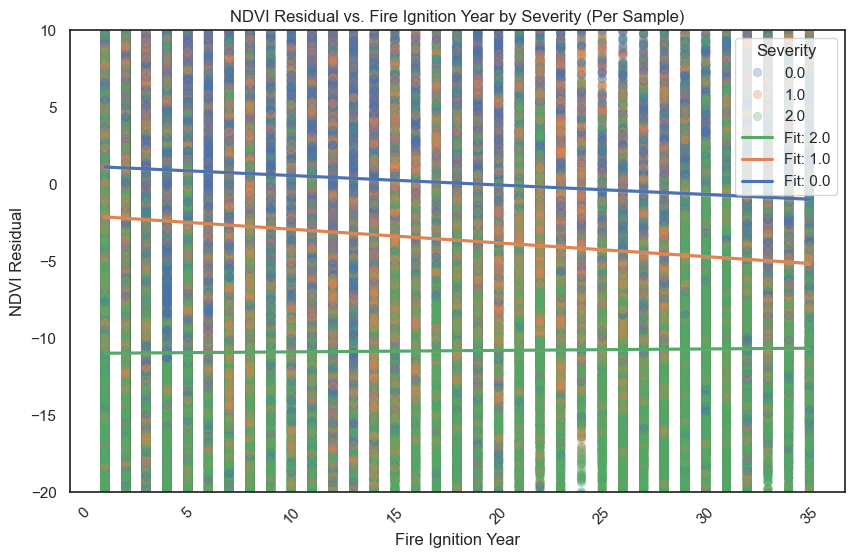

In [118]:
plt.figure(figsize=(10, 6))
# Define a consistent color palette
palette = sns.color_palette("deep", n_colors=fire_stats['severity'].nunique())
severity_colors = dict(zip(fire_stats['severity'].unique(), palette))
sns.scatterplot(x='YSF', y='rh_98_residual', data=df, hue='severity', alpha=0.3, edgecolor=None, palette=severity_colors,)

# Optionally add a lowess fit line if you want to visualize trends, though it may clutter the plot with individual points
for severity in df['severity'].unique():
    subset = df[df['severity'] == severity]
    sns.regplot(
        x='YSF', y='rh_98_residual', data=subset, color=severity_colors[severity],
        scatter=False, lowess=False, label=f"Fit: {severity}", ci=95  # No CI for clarity in this context
    )

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('NDVI Residual')
plt.title('NDVI Residual vs. Fire Ignition Year by Severity (Per Sample)')
plt.ylim((-20, 10))

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show plot
plt.legend(title="Severity")
plt.show()

/maps/fire-regen/fire_env/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


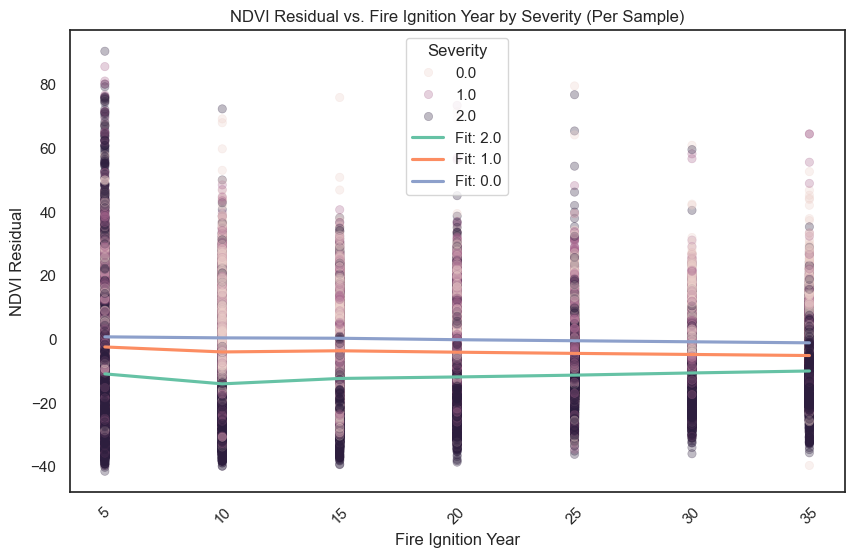

In [78]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='YSF_cat_5', y='rh_98_residual', data=df, hue='severity', alpha=0.3, edgecolor=None)

# Optionally add a lowess fit line if you want to visualize trends, though it may clutter the plot with individual points
for severity in df['severity'].unique():
    subset = df[df['severity'] == severity]
    sns.regplot(
        x='YSF_cat_5', y='rh_98_residual', data=subset,
        scatter=False, lowess=True, label=f"Fit: {severity}", ci=None  # No CI for clarity in this context
    )

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('NDVI Residual')
plt.title('NDVI Residual vs. Fire Ignition Year by Severity (Per Sample)')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show plot
plt.legend(title="Severity")
plt.show()

In [82]:
df = df[df.dnbr_mean > -100]

/maps/fire-regen/fire_env/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


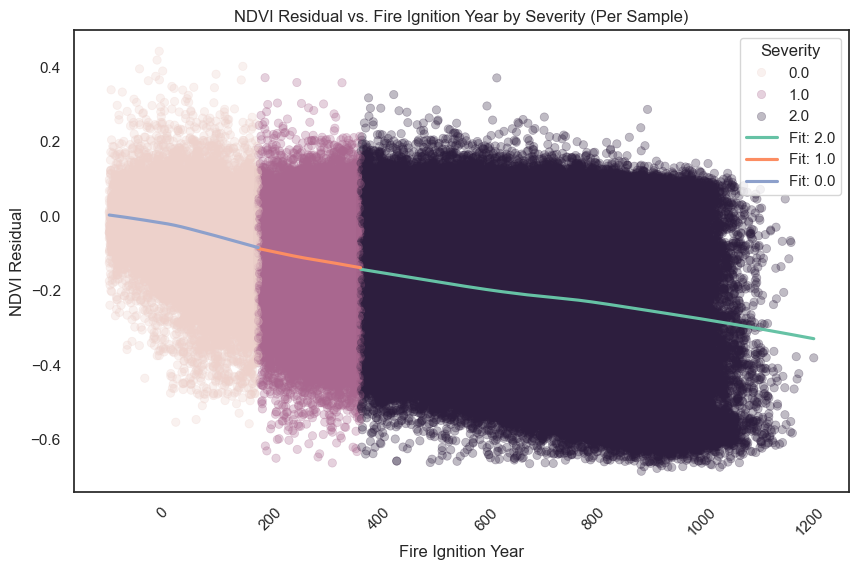

In [83]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='dnbr_mean', y='ndvi_residual', data=df, hue='severity', alpha=0.3, edgecolor=None)

# Optionally add a lowess fit line if you want to visualize trends, though it may clutter the plot with individual points
for severity in df['severity'].unique():
    subset = df[df['severity'] == severity]
    sns.regplot(
        x='dnbr_mean', y='ndvi_residual', data=subset,
        scatter=False, lowess=True, label=f"Fit: {severity}", ci=None  # No CI for clarity in this context
    )

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('NDVI Residual')
plt.title('NDVI Residual vs. Fire Ignition Year by Severity (Per Sample)')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show plot
plt.legend(title="Severity")
plt.show()

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='dnbr_mean', y='ndvi_residual', data=df, hue='severity', alpha=0.3, edgecolor=None)

# Optionally add a lowess fit line if you want to visualize trends, though it may clutter the plot with individual points
for severity in df['severity'].unique():
    subset = df[df['severity'] == severity]
    sns.regplot(
        x='dnbr_mean', y='ndvi_residual', data=subset,
        scatter=False, lowess=True, label=f"Fit: {severity}", ci=None  # No CI for clarity in this context
    )

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('NDVI Residual')
plt.title('NDVI Residual vs. Fire Ignition Year by Severity (Per Sample)')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show plot
plt.legend(title="Severity")
plt.show()

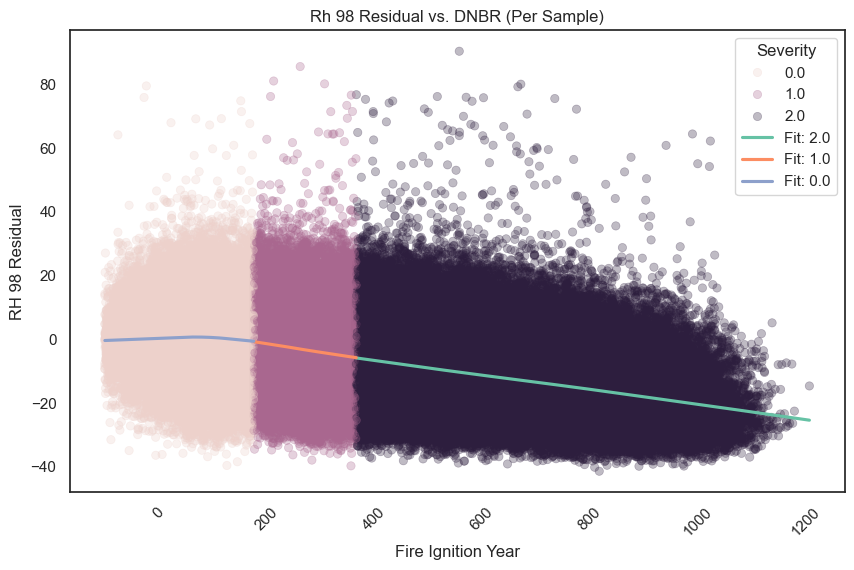

In [87]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='dnbr_mean', y='rh_98_residual', data=df, hue='severity', alpha=0.3, edgecolor=None)

# Optionally add a lowess fit line if you want to visualize trends, though it may clutter the plot with individual points
for severity in df['severity'].unique():
    subset = df[df['severity'] == severity]
    sns.regplot(
        x='dnbr_mean', y='rh_98_residual', data=subset,
        scatter=False, lowess=True, label=f"Fit: {severity}", ci=None  # No CI for clarity in this context
    )

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('RH 98 Residual')
plt.title('Rh 98 Residual vs. DNBR (Per Sample)')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show plot
plt.legend(title="Severity")
plt.show()

/maps/fire-regen/fire_env/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


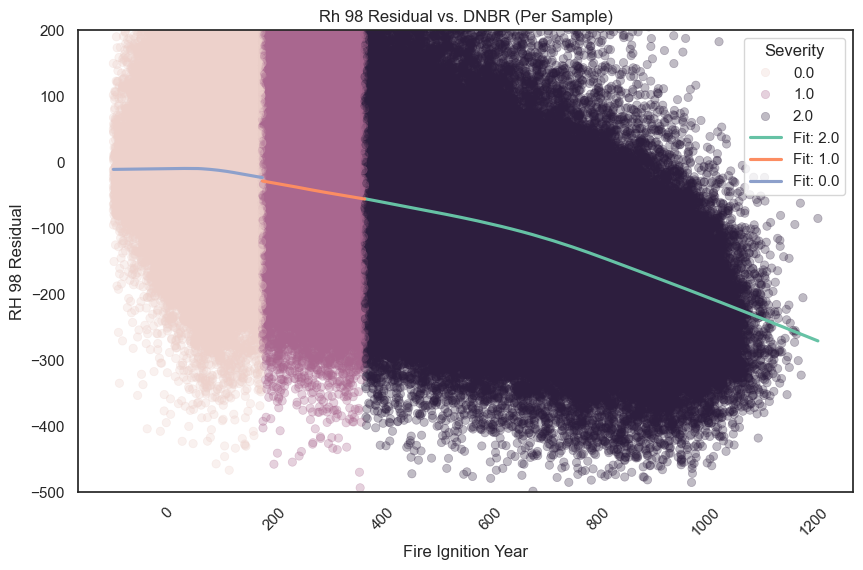

In [125]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='dnbr_mean', y='agbd_residual', data=df, hue='severity', alpha=0.3, edgecolor=None)

# Optionally add a lowess fit line if you want to visualize trends, though it may clutter the plot with individual points
for severity in df['severity'].unique():
    subset = df[df['severity'] == severity]
    sns.regplot(
        x='dnbr_mean', y='agbd_residual', data=subset,
        scatter=False, lowess=True, label=f"Fit: {severity}", ci=None  # No CI for clarity in this context
    )

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('RH 98 Residual')
plt.title('Rh 98 Residual vs. DNBR (Per Sample)')
plt.ylim((-500, 200))

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show plot
plt.legend(title="Severity")
plt.show()

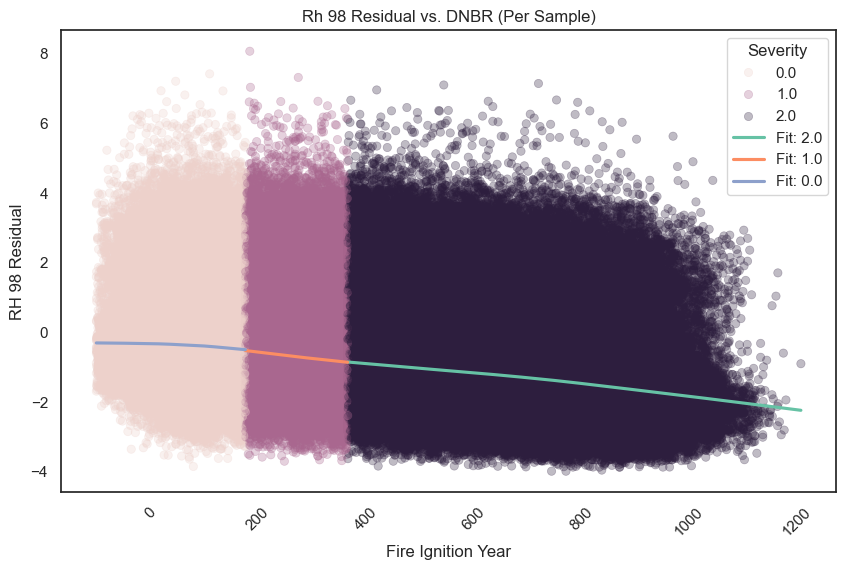

In [124]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='dnbr_mean', y='pai_residual', data=df, hue='severity', alpha=0.3, edgecolor=None)

# Optionally add a lowess fit line if you want to visualize trends, though it may clutter the plot with individual points
for severity in df['severity'].unique():
    subset = df[df['severity'] == severity]
    sns.regplot(
        x='dnbr_mean', y='pai_residual', data=subset,
        scatter=False, lowess=True, label=f"Fit: {severity}", ci=None  # No CI for clarity in this context
    )

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('RH 98 Residual')
plt.title('Rh 98 Residual vs. DNBR (Per Sample)')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show plot
plt.legend(title="Severity")
plt.show()

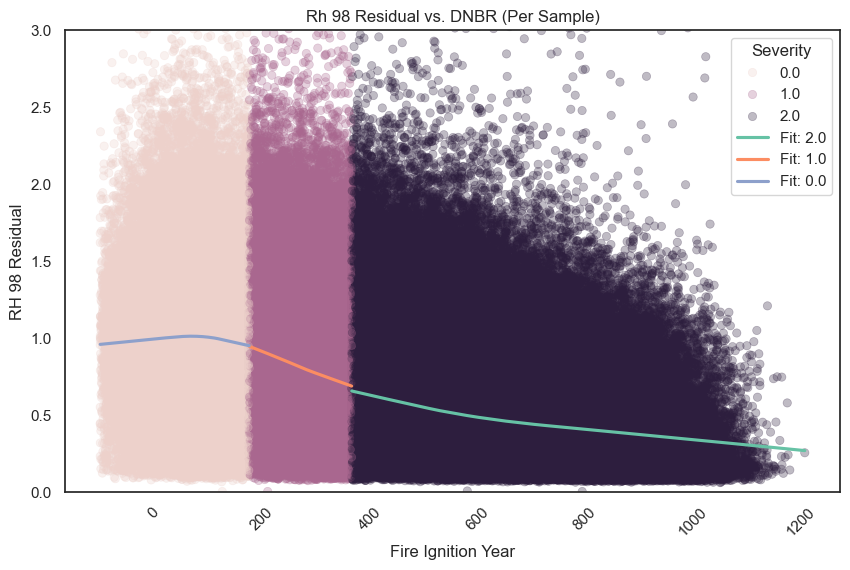

In [122]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='dnbr_mean', y='rh_98_rel', data=df, hue='severity', alpha=0.3, edgecolor=None)

# Optionally add a lowess fit line if you want to visualize trends, though it may clutter the plot with individual points
for severity in df['severity'].unique():
    subset = df[df['severity'] == severity]
    sns.regplot(
        x='dnbr_mean', y='rh_98_rel', data=subset,
        scatter=False, lowess=True, label=f"Fit: {severity}", ci=None  # No CI for clarity in this context
    )

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('RH 98 Residual')
plt.title('Rh 98 Residual vs. DNBR (Per Sample)')
plt.ylim((0, 3))

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show plot
plt.legend(title="Severity")
plt.show()

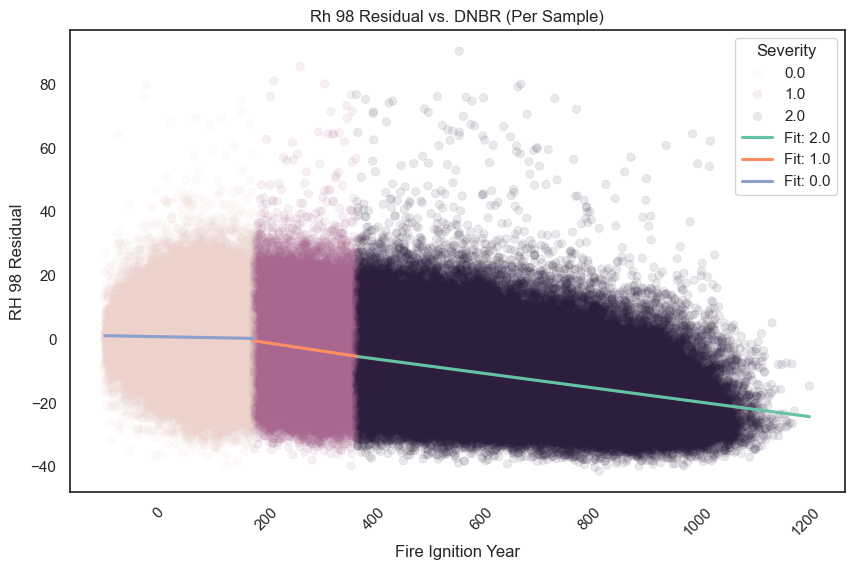

In [119]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='dnbr_mean', y='rh_98_residual', data=df, hue='severity', alpha=0.1, edgecolor=None)

# Optionally add a lowess fit line if you want to visualize trends, though it may clutter the plot with individual points
for severity in df['severity'].unique():
    subset = df[df['severity'] == severity]
    sns.regplot(
        x='dnbr_mean', y='rh_98_residual', data=subset,
        scatter=False, lowess=False, label=f"Fit: {severity}", ci=95  # No CI for clarity in this context
    )

# Add plot labels and title
plt.xlabel('Fire Ignition Year')
plt.ylabel('RH 98 Residual')
plt.title('Rh 98 Residual vs. DNBR (Per Sample)')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show plot
plt.legend(title="Severity")
plt.show()

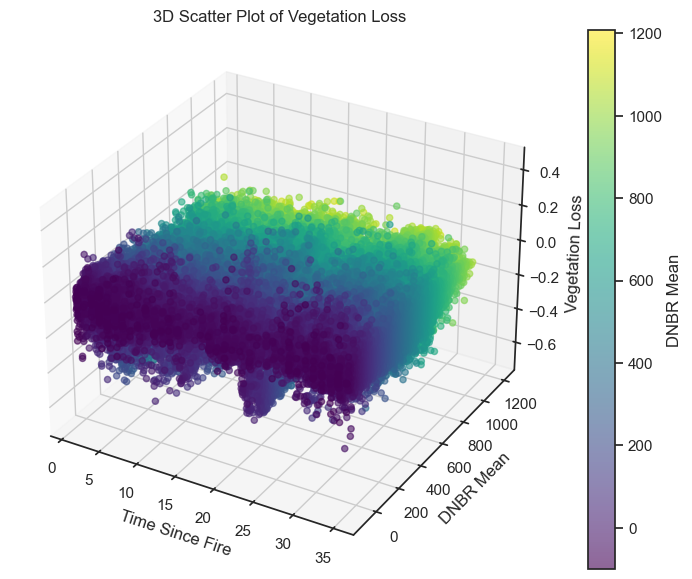

In [88]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

# Assuming 'df' has 'time_since_fire', 'dnbr_mean', and 'veg_loss' columns

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
sc = ax.scatter(df['YSF'], df['dnbr_mean'], df['ndvi_residual'], c=df['dnbr_mean'], cmap='viridis', alpha=0.6)

# Labels
ax.set_xlabel('Time Since Fire')
ax.set_ylabel('DNBR Mean')
ax.set_zlabel('Vegetation Loss')

# Color bar
plt.colorbar(sc, ax=ax, label='DNBR Mean')

plt.title('3D Scatter Plot of Vegetation Loss')
plt.show()

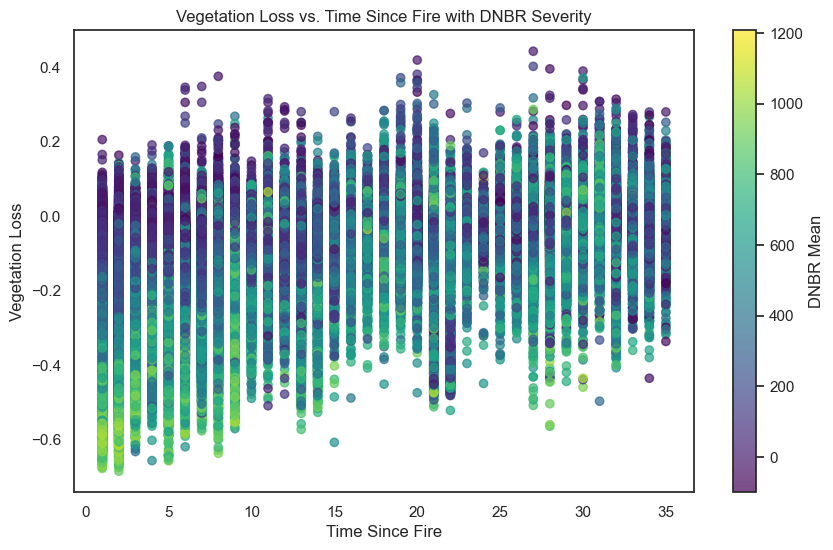

In [89]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' has 'time_since_fire', 'dnbr_mean', and 'veg_loss' columns

plt.figure(figsize=(10, 6))
scatter = plt.scatter(df['YSF'], df['ndvi_residual'], c=df['dnbr_mean'], cmap='viridis', alpha=0.7)
plt.colorbar(scatter, label='DNBR Mean')

plt.xlabel('Time Since Fire')
plt.ylabel('Vegetation Loss')
plt.title('Vegetation Loss vs. Time Since Fire with DNBR Severity')

plt.show()

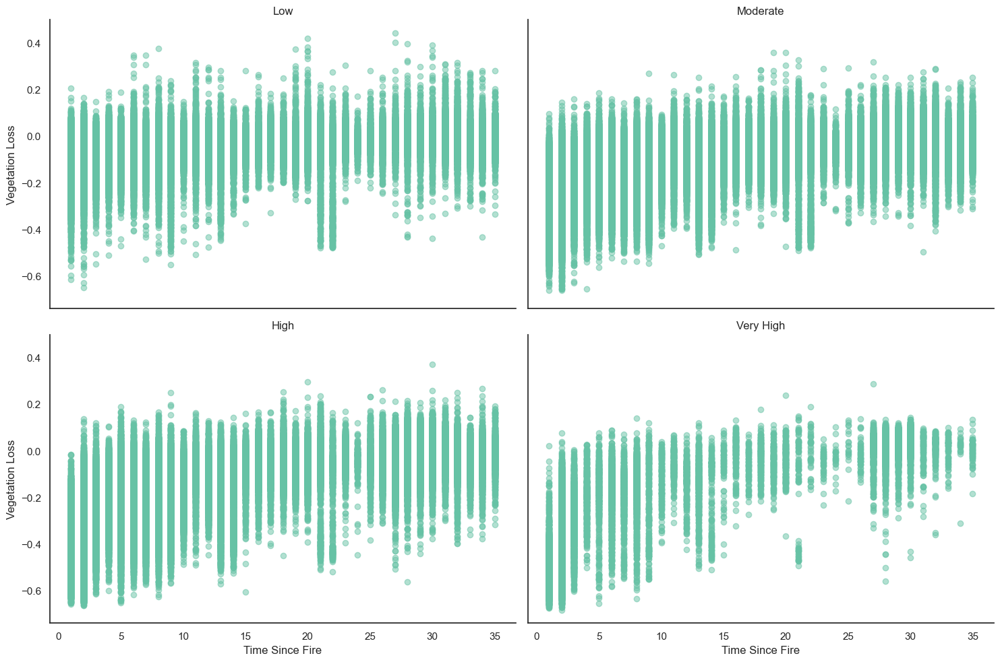

In [90]:
import seaborn as sns
import matplotlib.pyplot as plt

# Bin the 'dnbr_mean' into categories for better visualization
df['dnbr_category'] = pd.cut(df['dnbr_mean'], bins=4, labels=['Low', 'Moderate', 'High', 'Very High'])

g = sns.FacetGrid(df, col='dnbr_category', col_wrap=2, height=5, aspect=1.5)
g.map(plt.scatter, 'YSF', 'ndvi_residual', alpha=0.5)

# Adding titles and labels
g.set_titles("{col_name}")
g.set_axis_labels("Time Since Fire", "Vegetation Loss")

plt.show()

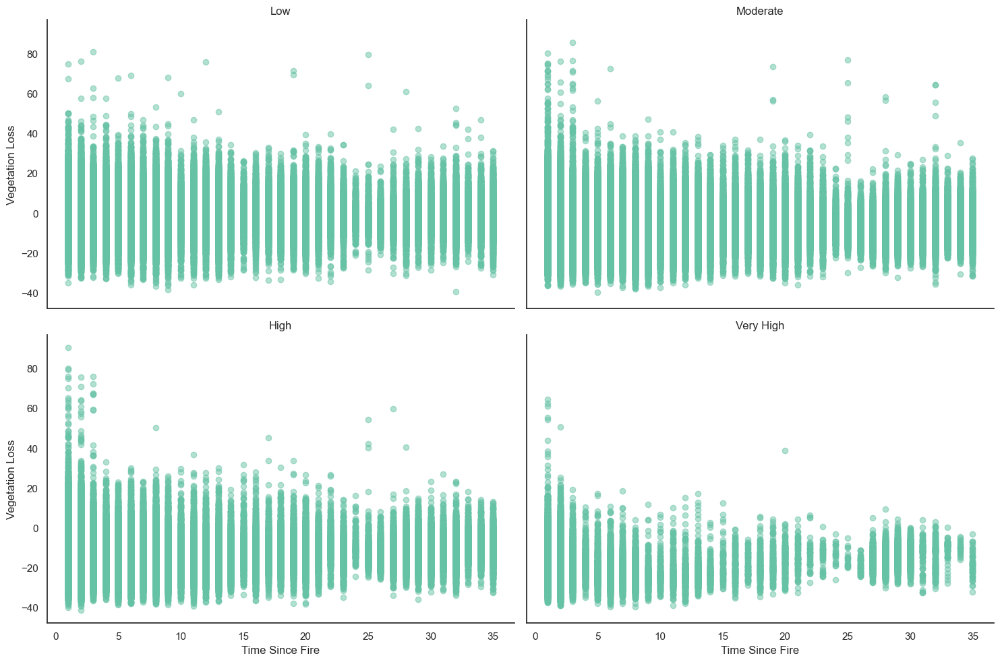

In [110]:
import seaborn as sns
import matplotlib.pyplot as plt

# Bin the 'dnbr_mean' into categories for better visualization
df['dnbr_category'] = pd.cut(df['dnbr_mean'], bins=4, labels=['Low', 'Moderate', 'High', 'Very High'])

g = sns.FacetGrid(df, col='dnbr_category', col_wrap=2, height=5, aspect=1.5)
g.map(plt.scatter, 'YSF', 'rh_98_residual', alpha=0.5)

# Adding titles and labels
g.set_titles("{col_name}")
g.set_axis_labels("Time Since Fire", "Vegetation Loss")

plt.show()